<a href="https://colab.research.google.com/github/YolandaMDavis/cs109a-fall2020/blob/yolanda-eda/Milestone_4_EDA_Modeling_Yolanda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
%matplotlib inline
import math
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
DATA_ROOT = '/content/drive/My Drive/Final-Project-for-CS109a/Milestone3/'

In [5]:
new_york_crime_data_df = pd.read_csv(DATA_ROOT + 'nyc_crime_analysis_data_final_corrected.csv').drop(columns=["Unnamed: 0"])
boston_crime_data_df = pd.read_csv(DATA_ROOT + 'boston_crime_analysis_data_final_corrected.csv').drop(columns=["Unnamed: 0"])

In [6]:
boston_crime_data_df.head()

,AREA,YEAR,MONTH,DAY_OF_WEEK,HOUR,LATITUDE,LONGITUDE,GEOHASH,COVID_PERIOD,WHITE,BLACK,ASIAN,HISPANIC,MEDIAN_INCOME,LOCAL_PROP_VALUES,STREETLIGHT_DENSITY,POLICE_STATION_DISTANCE,HOSPITAL_DISTANCE,COLLEGE_UNIV_DISTANCE,ELECTION,PRCP,SNOW,NIGHT,OFFENSE_TYPE,VIOLENT_CRIME
0,B3,2019,11,Tuesday,12,42.282081,-71.073648,drt2w9jwzznv,0,0.067967,0.730087,0.017705,0.153209,48196.9000,1.134155e+06,2,1513.079336,834.623723,872.359923,0.040000,0.08,0.0,0,Other,0
1,E18,2019,11,Monday,16,42.256215,-71.124019,drt2ms9061rs,0,0.244541,0.455357,0.017981,0.248827,70810.1300,1.385641e+06,39,34.838449,4438.528849,1159.194869,0.150000,0.00,0.0,0,Other,0
2,A1,2019,11,Saturday,21,42.360866,-71.061316,drt2yzw9zmf2,0,0.727176,0.030437,0.140236,0.080069,89833.4675,3.901778e+07,38,135.597516,212.813436,224.232672,0.277500,0.00,0.0,1,Warrant,0
3,A1,2020,1,Wednesday,1,42.364167,-71.054070,drt3p0hj0jj7,0,0.727176,0.030437,0.140236,0.080069,89833.4675,1.557071e+06,61,574.064333,476.760424,200.328782,0.277500,0.00,0.0,1,Other,0
4,D4,2020,1,Sunday,0,42.339541,-71.069408,drt2yg8vdy2r,0,0.654461,0.062627,0.144875,0.107735,65903.7975,2.688223e+07,46,22.586946,228.619458,373.498923,0.166667,0.11,0.0,1,Other,0


In [7]:
new_york_crime_data_df.head()

,AREA,YEAR,MONTH,DAY_OF_WEEK,HOUR,LATITUDE,LONGITUDE,GEOHASH,COVID_PERIOD,WHITE,BLACK,ASIAN,HISPANIC,MEDIAN_INCOME,LOCAL_PROP_VALUES,STREETLIGHT_DENSITY,POLICE_STATION_DISTANCE,HOSPITAL_DISTANCE,COLLEGE_UNIV_DISTANCE,ELECTION,PRCP,SNOW,NIGHT,OFFENSE_TYPE,VIOLENT_CRIME
0,BRONX,2020,8,Monday,20,40.832826,-73.867539,dr72r17k3w6x,1,0.090989,0.290291,0.038122,0.561581,38740.12777,1.386767e+05,1,1101.449779,2566.906882,3579.728371,0.11,0.00,0.0,1,Harassment,0
1,BRONX,2020,9,Wednesday,18,40.808451,-73.926321,dr72jubqryef,1,0.090989,0.290291,0.038122,0.561581,38740.12777,6.435754e+05,1,230.789826,694.403670,1033.295282,0.11,0.00,0.0,0,Harassment,0
2,BRONX,2020,9,Friday,15,40.811410,-73.927712,dr72jtrrxqq9,1,0.090989,0.290291,0.038122,0.561581,38740.12777,1.666114e+06,2,233.944031,575.736496,751.840019,0.11,0.00,0.0,0,Harassment,0
3,BRONX,2020,9,Monday,13,40.899198,-73.858230,dr72xm6p4e0j,1,0.090989,0.290291,0.038122,0.561581,38740.12777,1.459344e+05,2,1575.724224,2773.233905,3369.644128,0.11,0.02,0.0,0,Harassment,0
4,BRONX,2020,9,Saturday,23,40.830722,-73.827126,dr782108pq2c,1,0.090989,0.290291,0.038122,0.561581,38740.12777,7.761149e+04,2,24.163023,3084.371160,5512.388687,0.11,0.00,0.0,1,Harassment,0


In [8]:
print(boston_crime_data_df.shape)
print(new_york_crime_data_df.shape)
print(boston_crime_data_df.columns)
print(boston_crime_data_df["OFFENSE_TYPE"].unique())

(491771, 25)
(306288, 25)
Index(['AREA', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'LATITUDE', 'LONGITUDE',
       'GEOHASH', 'COVID_PERIOD', 'WHITE', 'BLACK', 'ASIAN', 'HISPANIC',
       'MEDIAN_INCOME', 'LOCAL_PROP_VALUES', 'STREETLIGHT_DENSITY',
       'POLICE_STATION_DISTANCE', 'HOSPITAL_DISTANCE', 'COLLEGE_UNIV_DISTANCE',
       'ELECTION', 'PRCP', 'SNOW', 'NIGHT', 'OFFENSE_TYPE', 'VIOLENT_CRIME'],
      dtype='object')
['Other' 'Warrant' 'Theft/Robbery/B&E' 'Assault and/or Battery'
 'Forgery/Fraud' 'Drugs/Alcohol' 'MV Accident/Property Damage' 'Val'
 'Violation of Order' 'Missing Person' 'Weapon' 'Harassment'
 'Animal Crime' 'Murder/Manslaughter/Homocide' 'Sex Offense' 'Kidnapping'
 'Child Abuse/Endangerment' 'Prostitution' 'Prisoner Offense']


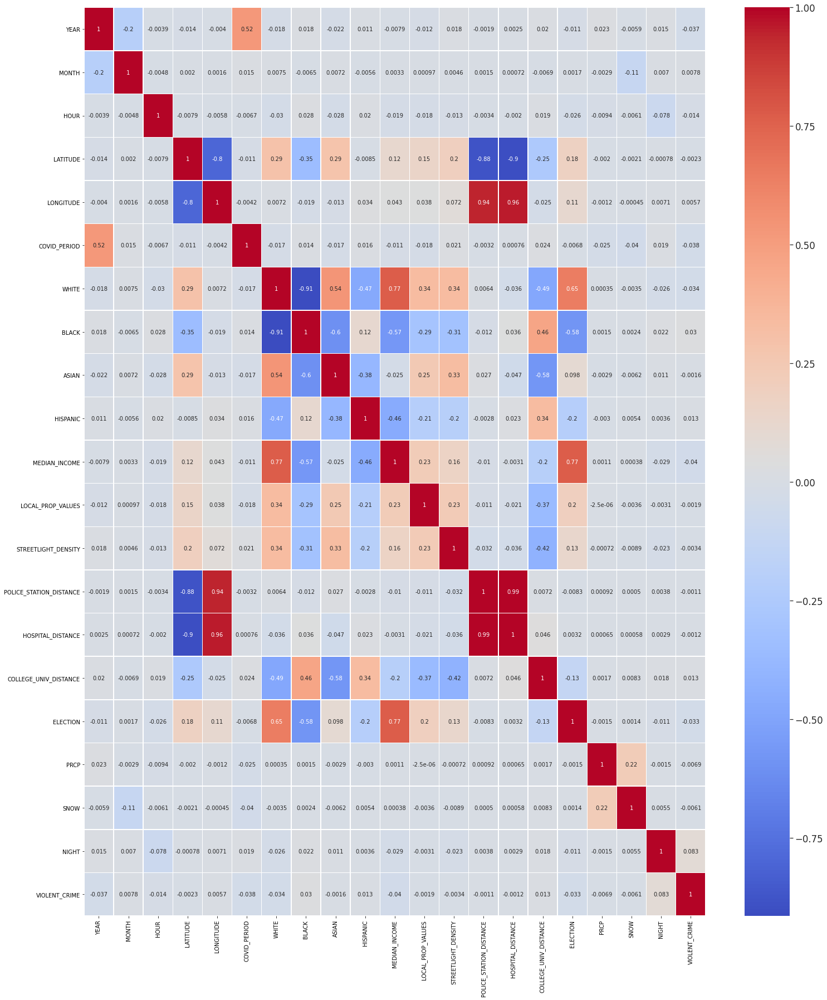

In [9]:
boston_corr = boston_crime_data_df.corr()
fig, ax = plt.subplots(figsize=(25,30)) 
sns.set(font_scale=1.5) 
ax = sns.heatmap(boston_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

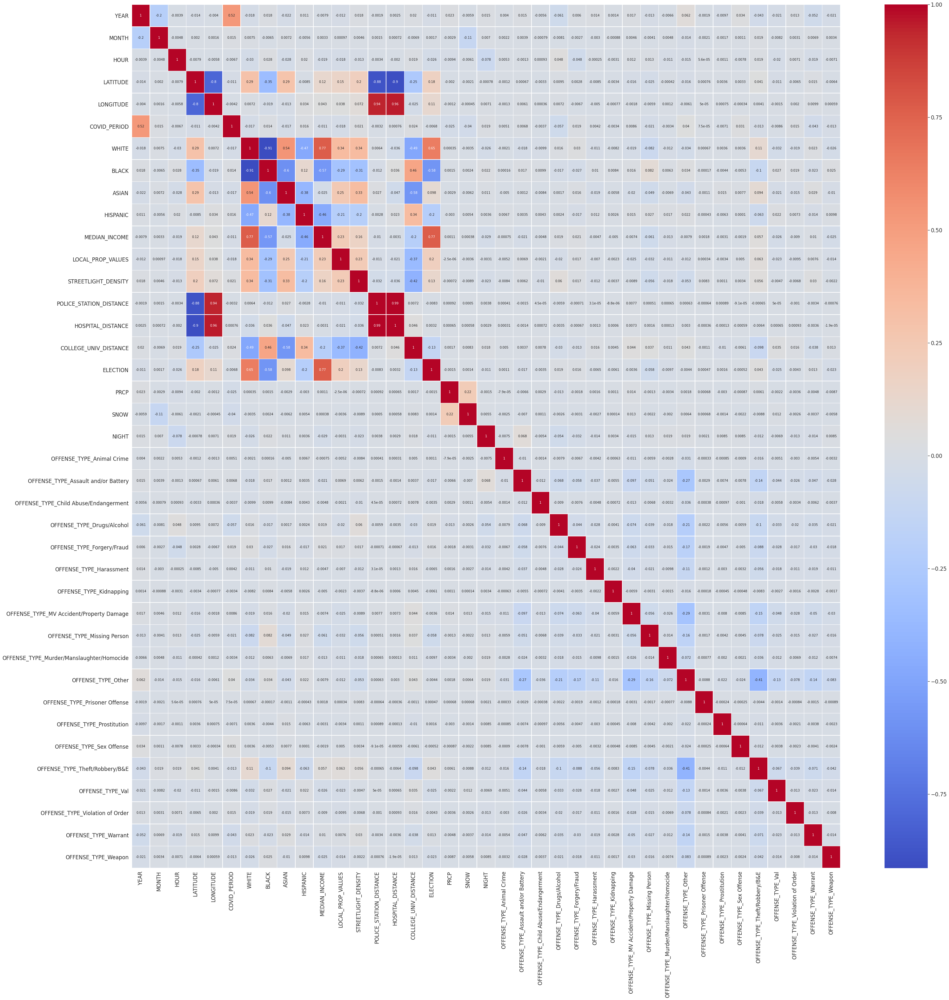

In [10]:
demog_category_columns = ['OFFENSE_TYPE']
boston_crime_dummies_df = pd.get_dummies(boston_crime_data_df, columns=demog_category_columns)
boston_corr = boston_crime_dummies_df.drop(columns=['VIOLENT_CRIME']).corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(boston_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

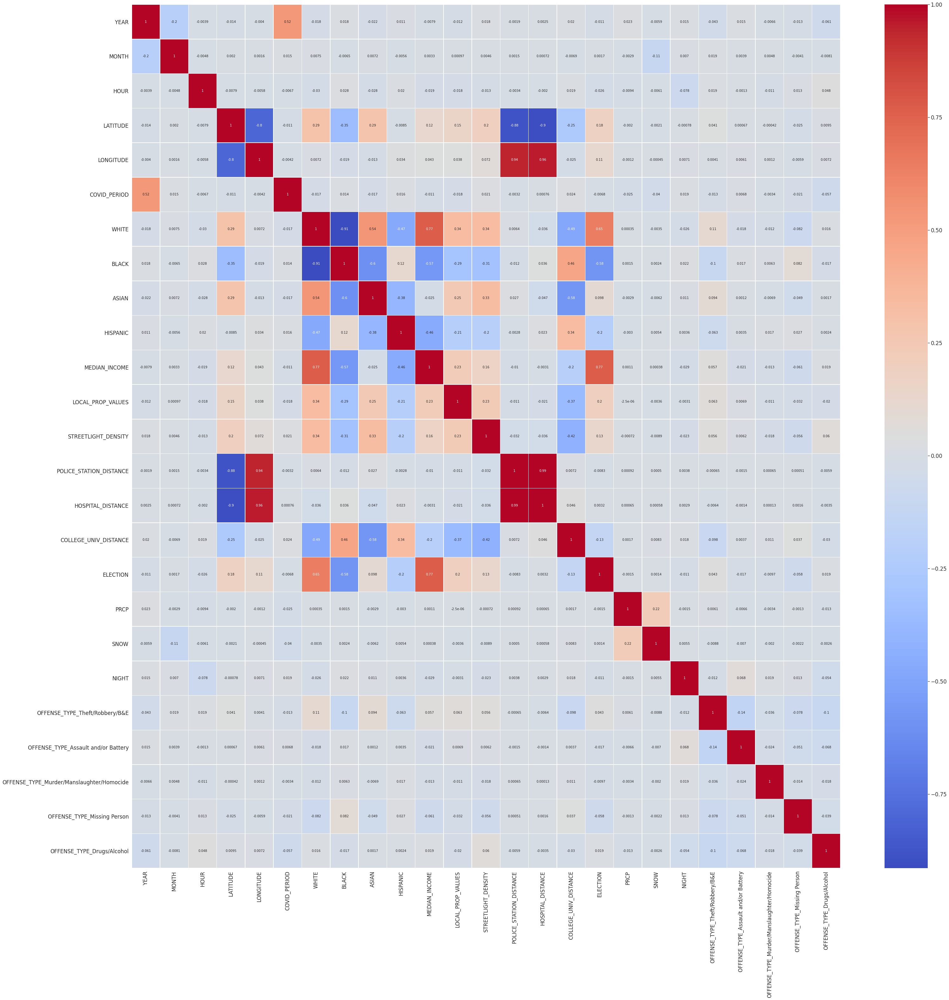

In [11]:
demog_category_columns = ['OFFENSE_TYPE']
boston_crime_dummies_df = pd.get_dummies(boston_crime_data_df, columns=demog_category_columns)
filter_columns = ['AREA', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'LATITUDE', 'LONGITUDE',
       'GEOHASH', 'COVID_PERIOD', 'WHITE', 'BLACK', 'ASIAN', 'HISPANIC',
       'MEDIAN_INCOME', 'LOCAL_PROP_VALUES', 'STREETLIGHT_DENSITY',
       'POLICE_STATION_DISTANCE', 'HOSPITAL_DISTANCE', 'COLLEGE_UNIV_DISTANCE',
       'ELECTION', 'PRCP', 'SNOW', 'NIGHT', 'OFFENSE_TYPE_Theft/Robbery/B&E','OFFENSE_TYPE_Assault and/or Battery','OFFENSE_TYPE_Murder/Manslaughter/Homocide','OFFENSE_TYPE_Missing Person', 'OFFENSE_TYPE_Drugs/Alcohol']

boston_corr = boston_crime_dummies_df.drop(columns=['VIOLENT_CRIME'])[filter_columns].corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(boston_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

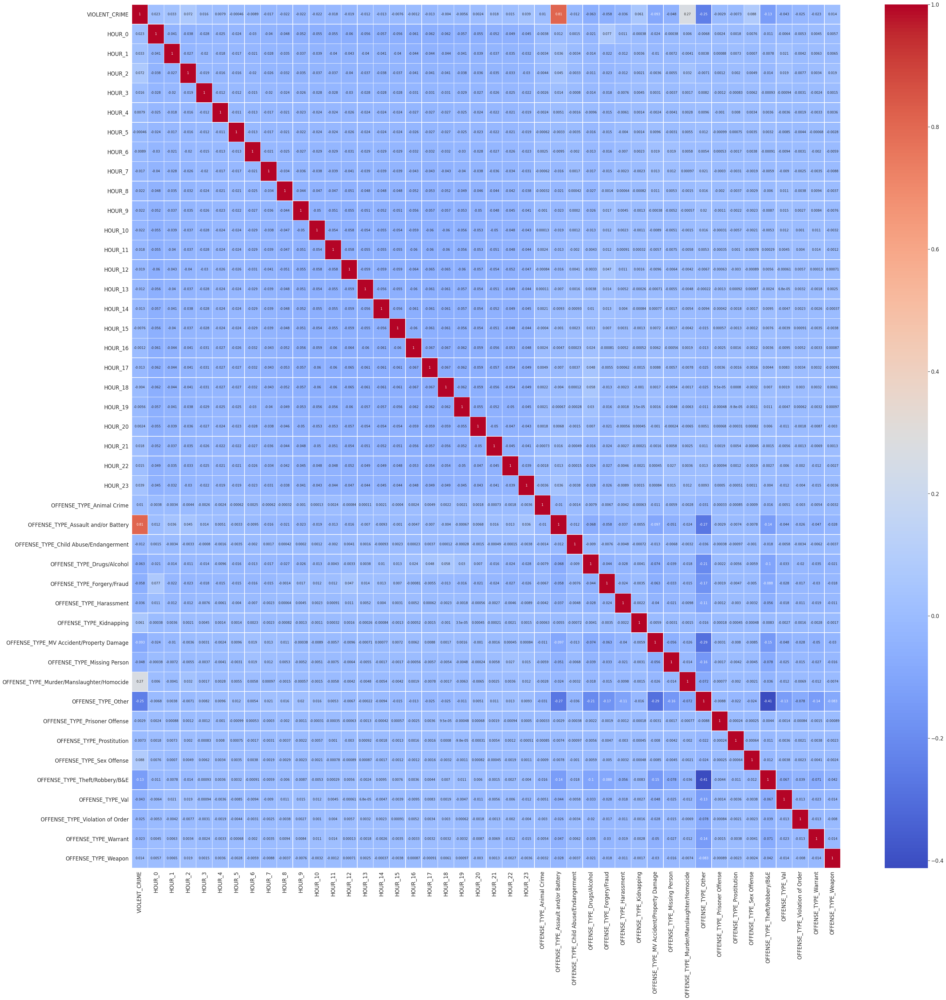

In [12]:
#Focus on Hour of Day / Day of Week for Violent Crime 
demog_category_columns = ["HOUR","OFFENSE_TYPE"]
boston_hour_day_df = boston_crime_data_df[["HOUR","VIOLENT_CRIME","OFFENSE_TYPE"]]
boston_hour_day_dummies_df = pd.get_dummies(boston_hour_day_df, columns=demog_category_columns)
boston_hour_day_corr = boston_hour_day_dummies_df.corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(boston_hour_day_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

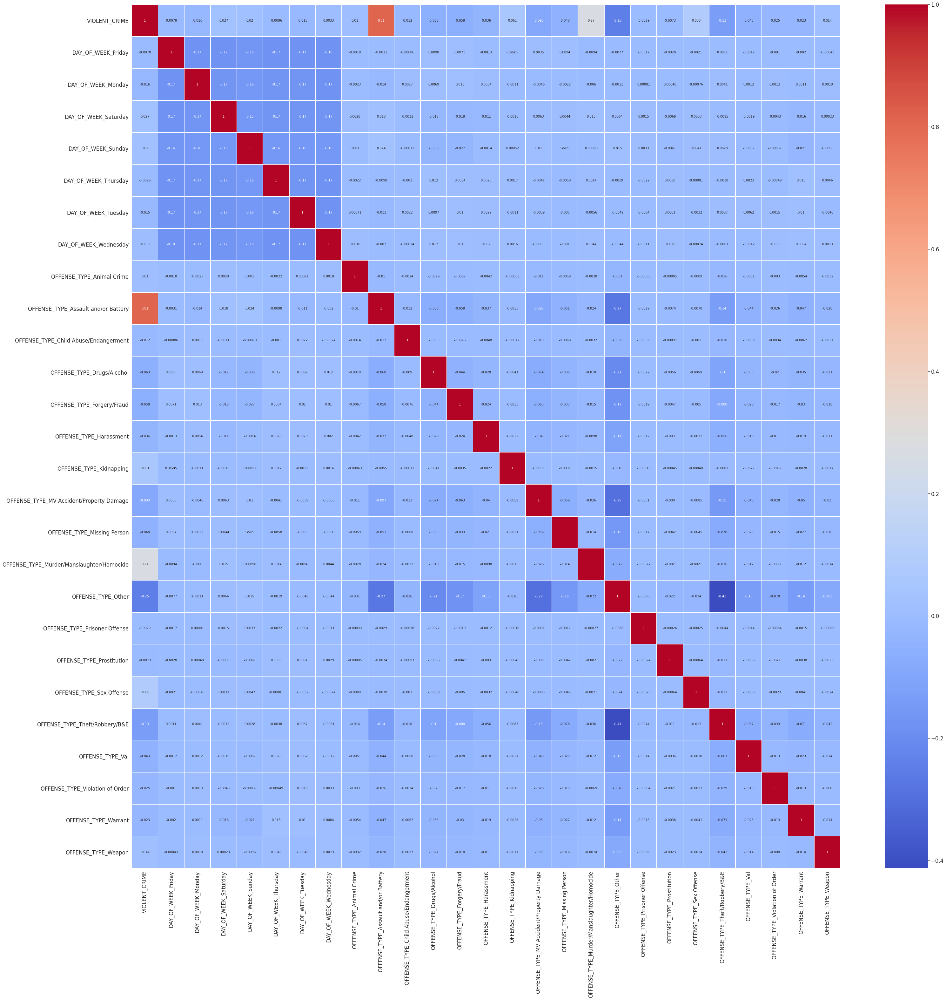

In [13]:
#Focus on Day of Week for Violent Crime 
demog_category_columns = ["DAY_OF_WEEK","OFFENSE_TYPE"]
boston_hour_day_df = boston_crime_data_df[["DAY_OF_WEEK","OFFENSE_TYPE","VIOLENT_CRIME"]]
boston_hour_day_dummies_df = pd.get_dummies(boston_hour_day_df, columns=demog_category_columns)
boston_hour_day_corr = boston_hour_day_dummies_df.corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(boston_hour_day_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

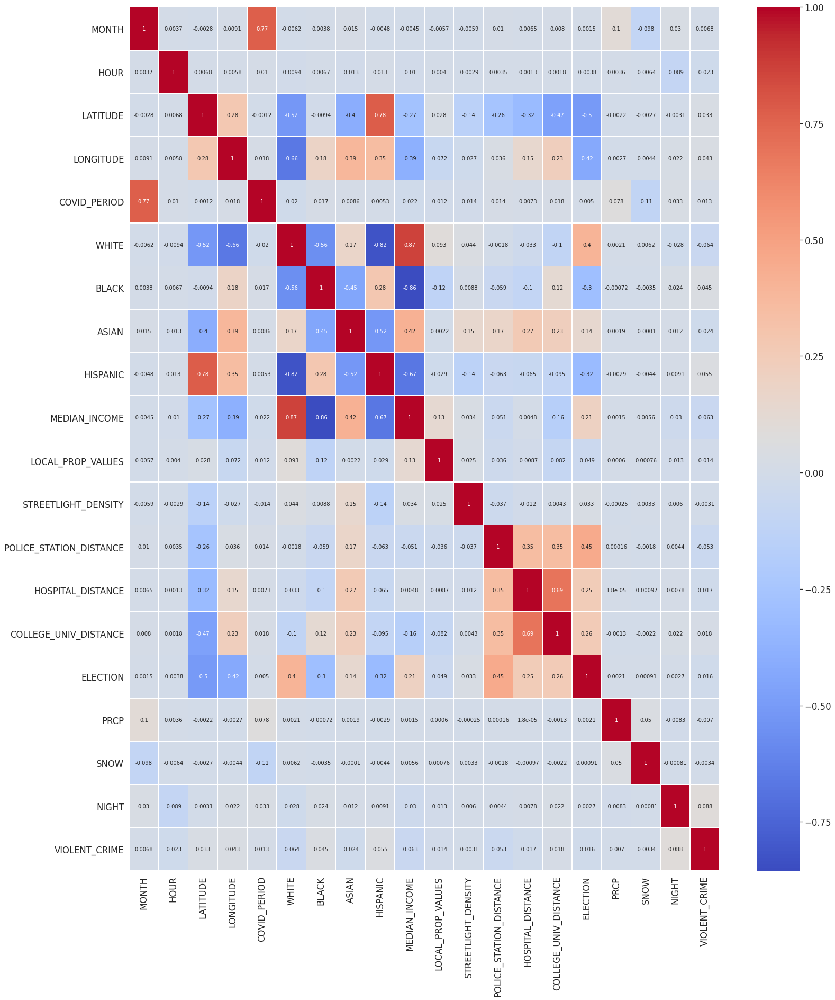

In [14]:
new_york_corr = new_york_crime_data_df.drop(columns=["YEAR"]).corr()
fig, ax = plt.subplots(figsize=(25,30)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(new_york_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

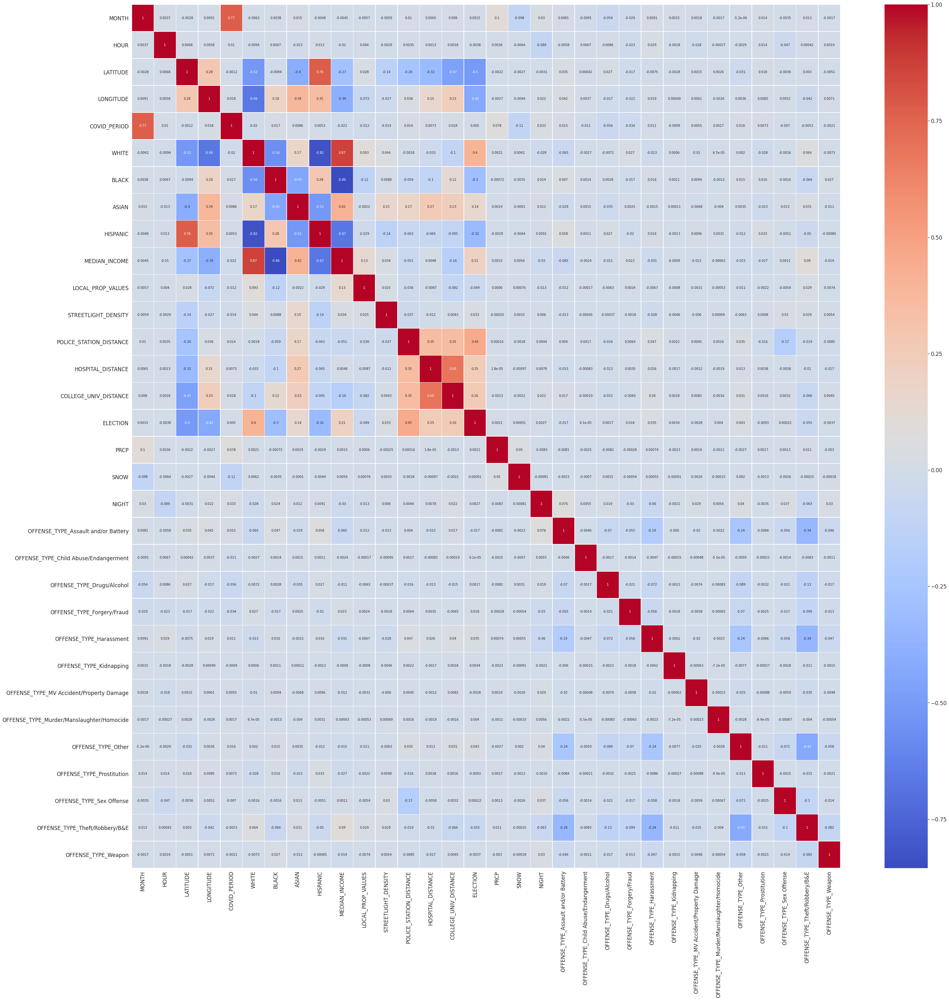

In [15]:
demog_category_columns = ['OFFENSE_TYPE']
new_york_crime_dummies_df = pd.get_dummies(new_york_crime_data_df, columns=demog_category_columns)
#dropping year since there is only one value for it
nyc_corr = new_york_crime_dummies_df.drop(columns=["YEAR","VIOLENT_CRIME"]).corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(nyc_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})



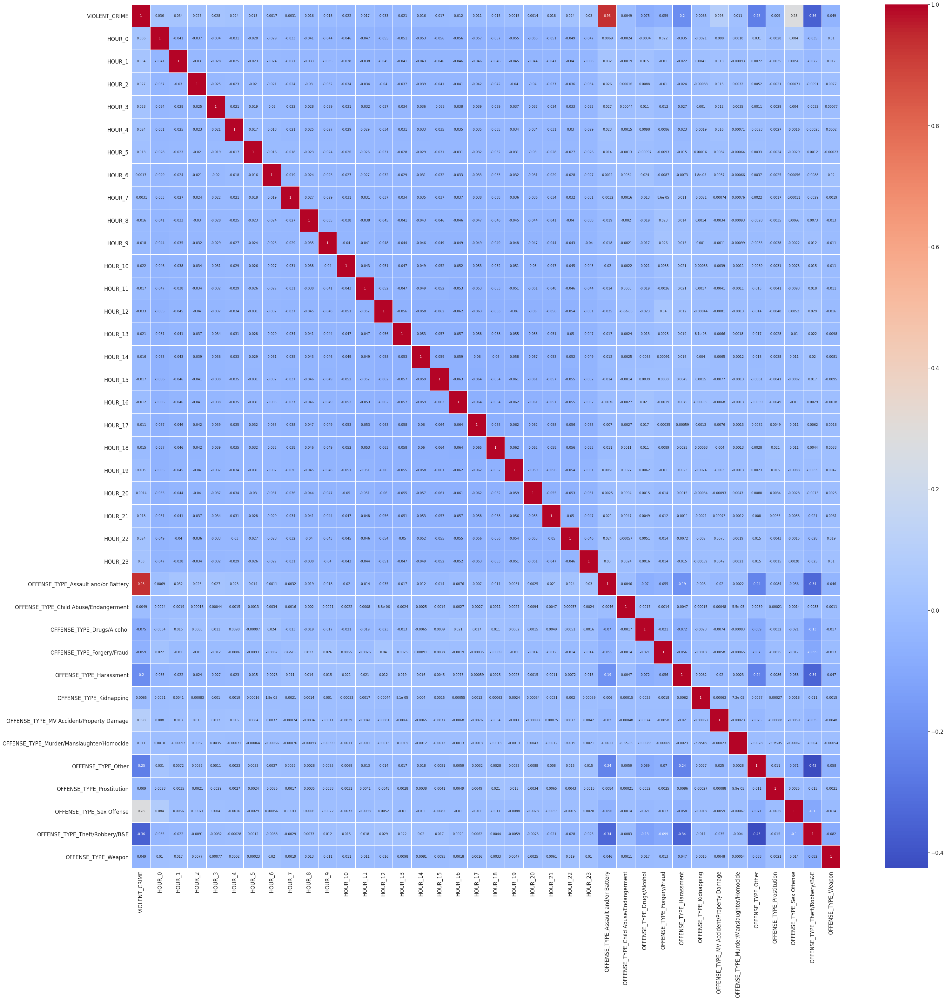

In [16]:
demog_category_columns = ["HOUR","OFFENSE_TYPE"]
new_york_hour_day_df = new_york_crime_data_df[["HOUR","VIOLENT_CRIME","OFFENSE_TYPE"]]
new_york_hour_day_dummies_df = pd.get_dummies(new_york_hour_day_df, columns=demog_category_columns)
nyc_hour_day_corr = new_york_hour_day_dummies_df.corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(nyc_hour_day_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

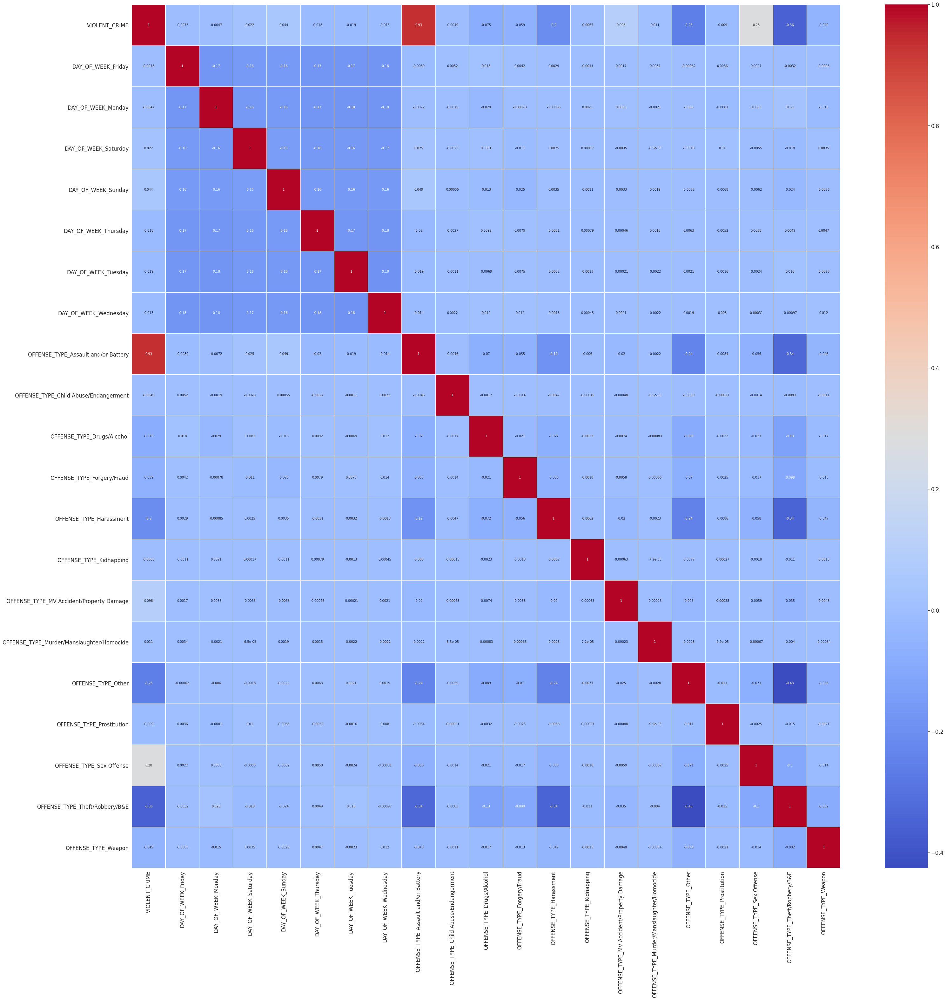

In [17]:
demog_category_columns = ["DAY_OF_WEEK","OFFENSE_TYPE"]
new_york_hour_day_df = new_york_crime_data_df[["DAY_OF_WEEK","VIOLENT_CRIME","OFFENSE_TYPE"]]
new_york_hour_day_dummies_df = pd.get_dummies(new_york_hour_day_df, columns=demog_category_columns)
nyc_hour_day_corr = new_york_hour_day_dummies_df.corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(nyc_hour_day_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

**Baseline Model for Predicting Violent Crime**


In [18]:
from sklearn.model_selection import train_test_split
random_state = 109

boston_crime_train, boston_crime_test = train_test_split(boston_crime_data_df, train_size=.8, random_state = random_state)

train_offenses = boston_crime_train['VIOLENT_CRIME'].count()
train_violent_crime = boston_crime_train[boston_crime_train["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
train_proportion_violent = round(train_violent_crime/train_offenses, 3)
train_accuracy = round(1 - train_proportion_violent,3)

test_offenses = boston_crime_test['VIOLENT_CRIME'].count()
test_violent_crime = boston_crime_test[boston_crime_test["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
test_proportion_violent = round(test_violent_crime/test_offenses, 3)
test_accuracy = round(1 - test_proportion_violent,3)

print(f"Proportion of violent crime (Boston): {train_proportion_violent}")
print(f"Naive Model Train Accuracy when classifying all offenses as not violent: {train_accuracy}")
print(f"Naive Model Test Accuracy when classifying all offenses as not violent: {test_accuracy}")


Proportion of violent crime (Boston): 0.082
Naive Model Train Accuracy when classifying all offenses as not violent: 0.918
Naive Model Test Accuracy when classifying all offenses as not violent: 0.918


In [19]:
nyc_crime_train, nyc_crime_test = train_test_split(new_york_crime_data_df, train_size=.8, random_state = random_state)

train_offenses = nyc_crime_train['VIOLENT_CRIME'].count()
train_violent_crime = nyc_crime_train[nyc_crime_train["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
train_proportion_violent = round(train_violent_crime/train_offenses, 3)
train_accuracy = round(1 - train_proportion_violent,3)

test_offenses = nyc_crime_test['VIOLENT_CRIME'].count()
test_violent_crime = nyc_crime_test[nyc_crime_test["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
test_proportion_violent = round(test_violent_crime/test_offenses, 3)
test_accuracy = round(1 - test_proportion_violent,3)

print(f"Proportion of violent crime (NYC) : {train_proportion_violent}")
print(f"Naive Model Train Accuracy when classifying all offenses as not violent: {train_accuracy}")
print(f"Naive Model Test Accuracy when classifying all offenses as not violent: {test_accuracy}")

Proportion of violent crime (NYC) : 0.176
Naive Model Train Accuracy when classifying all offenses as not violent: 0.824
Naive Model Test Accuracy when classifying all offenses as not violent: 0.824


In [20]:
combined_crime_data_df = pd.concat([boston_crime_data_df, new_york_crime_data_df])
comb_crime_train, comb_crime_test = train_test_split(combined_crime_data_df, train_size=.8, random_state = random_state)

train_offenses = comb_crime_train['VIOLENT_CRIME'].count()
train_violent_crime = comb_crime_train[comb_crime_train["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
train_proportion_violent = round(train_violent_crime/train_offenses, 3)
train_accuracy = round(1 - train_proportion_violent,3)

test_offenses = comb_crime_test['VIOLENT_CRIME'].count()
test_violent_crime = comb_crime_test[comb_crime_test["VIOLENT_CRIME"] == 1]['VIOLENT_CRIME'].sum()
test_proportion_violent = round(test_violent_crime/test_offenses, 3)
test_accuracy = round(1 - test_proportion_violent,3)

print(f"Proportion of violent crime (Combined) : {train_proportion_violent}")
print(f"Naive Model Train Accuracy when classifying all offenses as not violent: {train_accuracy}")
print(f"Naive Model Test Accuracy when classifying all offenses as not violent: {test_accuracy}")

Proportion of violent crime (Combined) : 0.118
Naive Model Train Accuracy when classifying all offenses as not violent: 0.882
Naive Model Test Accuracy when classifying all offenses as not violent: 0.882


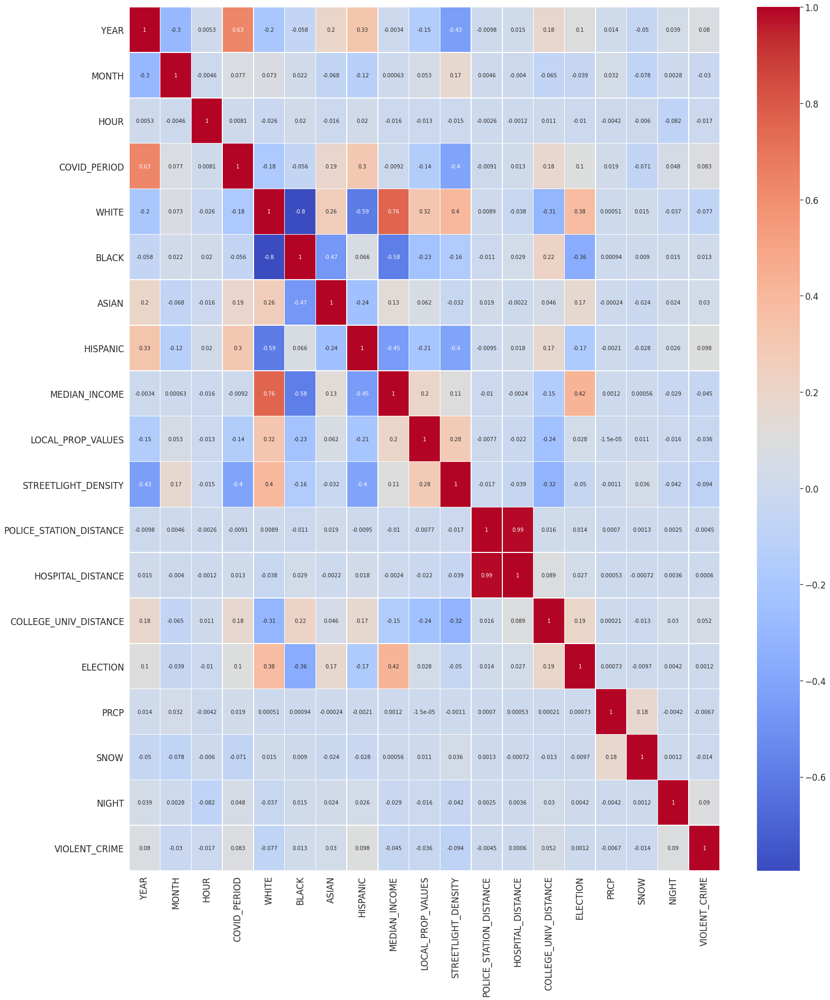

In [21]:
comb_corr = combined_crime_data_df.drop(columns=["AREA","LATITUDE","LONGITUDE"]).corr()
fig, ax = plt.subplots(figsize=(25,30)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(comb_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

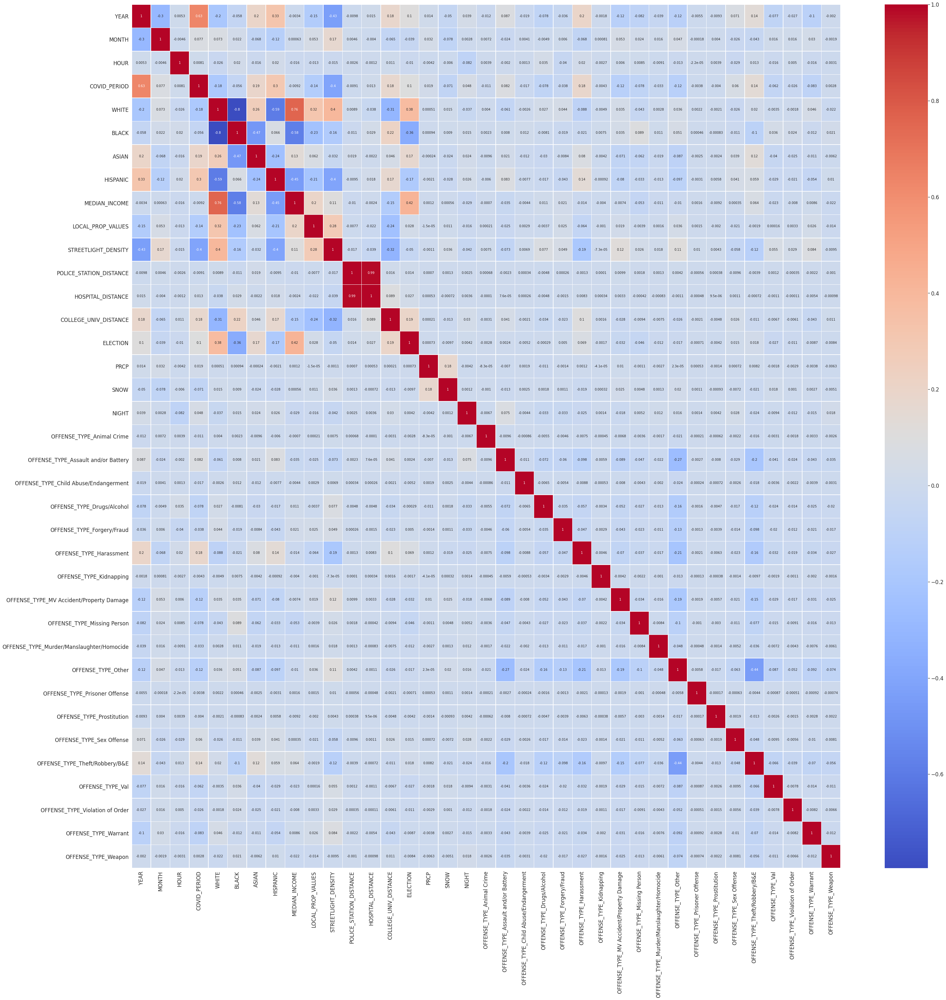

In [22]:
demog_category_columns = ['OFFENSE_TYPE']
combined_crime_dummies_df = pd.get_dummies(combined_crime_data_df, columns=demog_category_columns)
#dropping year since there is only one value for it
comb_corr = combined_crime_dummies_df.drop(columns=["VIOLENT_CRIME","AREA","LATITUDE","LONGITUDE"]).corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(comb_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

In [23]:
boston_other_offenses = boston_crime_data_df[boston_crime_data_df["OFFENSE_TYPE"] == "Other"].shape[0]
boston_total_offenses = boston_crime_data_df.shape[0]
print(boston_other_offenses / boston_total_offenses)

other_offenses = combined_crime_data_df[combined_crime_data_df["OFFENSE_TYPE"] == "Other"].shape[0]
total_offenses = combined_crime_data_df.shape[0]
print(other_offenses / total_offenses)

0.45050643490567766
0.3663262991833937


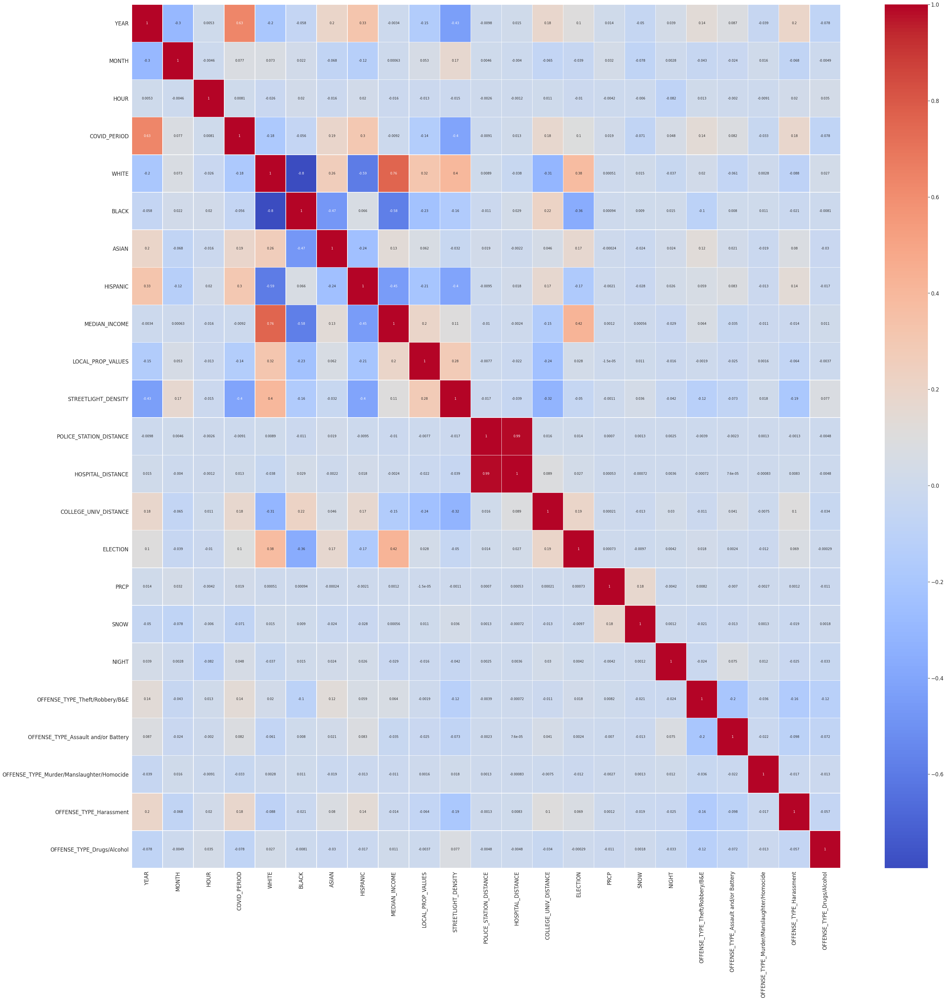

In [24]:
demog_category_columns = ['OFFENSE_TYPE']
combined_crime_dummies_df = pd.get_dummies(combined_crime_data_df, columns=demog_category_columns)
filter_columns = ['YEAR','MONTH', 'DAY_OF_WEEK', 'HOUR', 'COVID_PERIOD', 'WHITE', 'BLACK', 'ASIAN', 'HISPANIC',
       'MEDIAN_INCOME', 'LOCAL_PROP_VALUES', 'STREETLIGHT_DENSITY',
       'POLICE_STATION_DISTANCE', 'HOSPITAL_DISTANCE', 'COLLEGE_UNIV_DISTANCE',
       'ELECTION', 'PRCP', 'SNOW', 'NIGHT', 'OFFENSE_TYPE_Theft/Robbery/B&E','OFFENSE_TYPE_Assault and/or Battery','OFFENSE_TYPE_Murder/Manslaughter/Homocide','OFFENSE_TYPE_Harassment', 'OFFENSE_TYPE_Drugs/Alcohol']
#dropping year since there is only one value for it
comb_corr = combined_crime_dummies_df.drop(columns=["VIOLENT_CRIME"])[filter_columns].corr()
fig, ax = plt.subplots(figsize=(50,50)) 
sns.set(font_scale=1.5)
ax = sns.heatmap(comb_corr, annot=True, cmap='coolwarm', linewidths=.5, annot_kws={"fontsize":10})

In [25]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression

# we'll evaluate for violent crime in Boston using all features (minus the other response variable for Offense Type)
demog_category_columns = ['AREA', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR']
train_crime_demog_dummies_df = pd.get_dummies(boston_crime_train.drop(columns=["OFFENSE_TYPE"]), columns=demog_category_columns)
test_crime_demog_dummies_df = pd.get_dummies(boston_crime_test.drop(columns=["OFFENSE_TYPE"]), columns=demog_category_columns)

# select all columns from dummies minus response and Geohash 
x_columns = train_crime_demog_dummies_df.drop(columns=["VIOLENT_CRIME","GEOHASH"]).columns

X_train = train_crime_demog_dummies_df[x_columns]
X_test = test_crime_demog_dummies_df[x_columns]

demog_scaler = MinMaxScaler()
demog_scaler.fit(X_train)
x_train_norm = demog_scaler.transform(X_train)
x_test_norm = demog_scaler.transform(X_test)

y_train = train_crime_demog_dummies_df['VIOLENT_CRIME'].values
y_test = test_crime_demog_dummies_df['VIOLENT_CRIME'].values

# attempt a baseline logistic regression without regularization
demog_logit_full = LogisticRegression(penalty='none', max_iter = 10000)
demog_logit_full.fit(x_train_norm,y_train)
demog_logit_full_train_accuracy = round(demog_logit_full.score(x_train_norm, y_train),3)
demog_logit_full_test_accuracy = round(demog_logit_full.score(x_test_norm, y_test),3)

b0 = round(demog_logit_full.intercept_[0],3)
print(f"Logistic Regression Estimated Betas (B0): {b0}")

for i, k in enumerate(x_columns):
    print(f"Logistic Regression Estimated Beta {k} (B{i + 1}): { round(demog_logit_full.coef_[0][i],3)}")

print(f"\nLogisitic Train Accuracy: {demog_logit_full_train_accuracy}, Logistic Test Accuracy: {demog_logit_full_test_accuracy}")

Logistic Regression Estimated Betas (B0): -0.869
Logistic Regression Estimated Beta LATITUDE (B1): -0.868
Logistic Regression Estimated Beta LONGITUDE (B2): -0.009
Logistic Regression Estimated Beta COVID_PERIOD (B3): 0.099
Logistic Regression Estimated Beta WHITE (B4): -0.366
Logistic Regression Estimated Beta BLACK (B5): -0.334
Logistic Regression Estimated Beta ASIAN (B6): -0.161
Logistic Regression Estimated Beta HISPANIC (B7): -0.292
Logistic Regression Estimated Beta MEDIAN_INCOME (B8): -0.293
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B9): 0.056
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B10): -0.168
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B11): -0.006
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B12): -0.01
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B13): 0.556
Logistic Regression Estimated Beta ELECTION (B14): -0.205
Logistic Regression Estimated Beta PRCP (B15): -0.193
Logistic Regression Estimated Beta SNOW 

In [26]:
from sklearn.linear_model import LogisticRegressionCV
c_list = [1e-3,1e-2,1e-1,1e0,1e1,1e2,1e3]
folds = 3
training_score = []

logit_lasso= LogisticRegressionCV(Cs=c_list, penalty='l2',solver='liblinear', max_iter = 1000, scoring='accuracy',cv=folds)
logit_lasso.fit(x_train_norm, y_train)
logit_lasso_score_train = logit_lasso.score(x_train_norm, y_train)
logit_lasso_score_test = logit_lasso.score(x_test_norm, y_test)


In [27]:
print(
    "The regularization parameter C chosen by this model: {}\n"
    "Training Accuracy: {:.3f}\n"
    "Test Accuracy: {:.3f}\n"
    .format(logit_lasso.C_[0], logit_lasso_score_train, logit_lasso_score_test)
)

The regularization parameter C chosen by this model: 0.001
Training Accuracy: 0.918
Test Accuracy: 0.918



In [28]:
for i, k in enumerate(x_columns):
    print(f"Logistic Regression w/Lasso Estimated Beta {k} (B{i + 1}): { round(logit_lasso.coef_[0][i],3)}")

Logistic Regression w/Lasso Estimated Beta LATITUDE (B1): -0.775
Logistic Regression w/Lasso Estimated Beta LONGITUDE (B2): -0.001
Logistic Regression w/Lasso Estimated Beta COVID_PERIOD (B3): -0.183
Logistic Regression w/Lasso Estimated Beta WHITE (B4): -0.354
Logistic Regression w/Lasso Estimated Beta BLACK (B5): -0.279
Logistic Regression w/Lasso Estimated Beta ASIAN (B6): -0.218
Logistic Regression w/Lasso Estimated Beta HISPANIC (B7): -0.23
Logistic Regression w/Lasso Estimated Beta MEDIAN_INCOME (B8): -0.286
Logistic Regression w/Lasso Estimated Beta LOCAL_PROP_VALUES (B9): -0.005
Logistic Regression w/Lasso Estimated Beta STREETLIGHT_DENSITY (B10): -0.109
Logistic Regression w/Lasso Estimated Beta POLICE_STATION_DISTANCE (B11): -0.0
Logistic Regression w/Lasso Estimated Beta HOSPITAL_DISTANCE (B12): -0.0
Logistic Regression w/Lasso Estimated Beta COLLEGE_UNIV_DISTANCE (B13): -0.064
Logistic Regression w/Lasso Estimated Beta ELECTION (B14): -0.204
Logistic Regression w/Lasso Esti

In [29]:
# Balancing weight of the LR
demog_logit_balanced = LogisticRegression(penalty='none', max_iter = 10000, class_weight="balanced")
demog_logit_balanced.fit(x_train_norm,y_train)
demog_logit_balanced_train_accuracy = round(demog_logit_balanced.score(x_train_norm, y_train),3)
demog_logit_balanced_test_accuracy = round(demog_logit_balanced.score(x_test_norm, y_test),3)

b0 = round(demog_logit_balanced.intercept_[0],3)
print(f"Logistic Regression Estimated Betas (B0): {b0}")

for i, k in enumerate(x_columns):
    print(f"Logistic Regression Estimated Beta {k} (B{i + 1}): { round(demog_logit_balanced.coef_[0][i],3)}")

print(f"\nLogisitic Train Accuracy: {demog_logit_balanced_train_accuracy}, Logistic Test Accuracy: {demog_logit_balanced_test_accuracy}")

Logistic Regression Estimated Betas (B0): -0.104
Logistic Regression Estimated Beta LATITUDE (B1): -0.108
Logistic Regression Estimated Beta LONGITUDE (B2): -0.003
Logistic Regression Estimated Beta COVID_PERIOD (B3): 0.105
Logistic Regression Estimated Beta WHITE (B4): -0.124
Logistic Regression Estimated Beta BLACK (B5): 0.024
Logistic Regression Estimated Beta ASIAN (B6): 0.043
Logistic Regression Estimated Beta HISPANIC (B7): -0.022
Logistic Regression Estimated Beta MEDIAN_INCOME (B8): -0.113
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B9): 0.075
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B10): -0.171
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B11): -0.001
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B12): -0.006
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B13): 0.42
Logistic Regression Estimated Beta ELECTION (B14): -0.073
Logistic Regression Estimated Beta PRCP (B15): -0.138
Logistic Regression Estimated Beta SNOW (B

In [30]:
from sklearn.linear_model import LogisticRegressionCV
c_list = [1e-3,1e-2,1e-1,1e0,1e1,1e2,1e3]
folds = 3
training_score = []

logit_lasso= LogisticRegressionCV(Cs=c_list, penalty='l2',solver='liblinear', max_iter = 1000, scoring='accuracy', cv=folds, class_weight="balanced")
logit_lasso.fit(x_train_norm, y_train)
logit_lasso_score_train = logit_lasso.score(x_train_norm, y_train)
logit_lasso_score_test = logit_lasso.score(x_test_norm, y_test)


In [31]:
print(
    "The regularization parameter C chosen by this model: {}\n"
    "Training Accuracy: {:.3f}\n"
    "Test Accuracy: {:.3f}\n"
    .format(logit_lasso.C_[0], logit_lasso_score_train, logit_lasso_score_test)
)

The regularization parameter C chosen by this model: 1000.0
Training Accuracy: 0.617
Test Accuracy: 0.617



In [32]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

ss = StandardScaler().fit(X_train)
Z_train = ss.transform(X_train)
Z_test = ss.transform(X_test)

pca_standard = PCA().fit(Z_train)
pca_Z_train = pca_standard.transform(Z_train)
pca_Z_test = pca_standard.transform(Z_test)

print(f"PCA Training Z Shape{pca_Z_train.shape}")
print(f"PCA Test Z Shape{pca_Z_test.shape}")

PCA Training Z Shape(393416, 78)
PCA Test Z Shape(98355, 78)


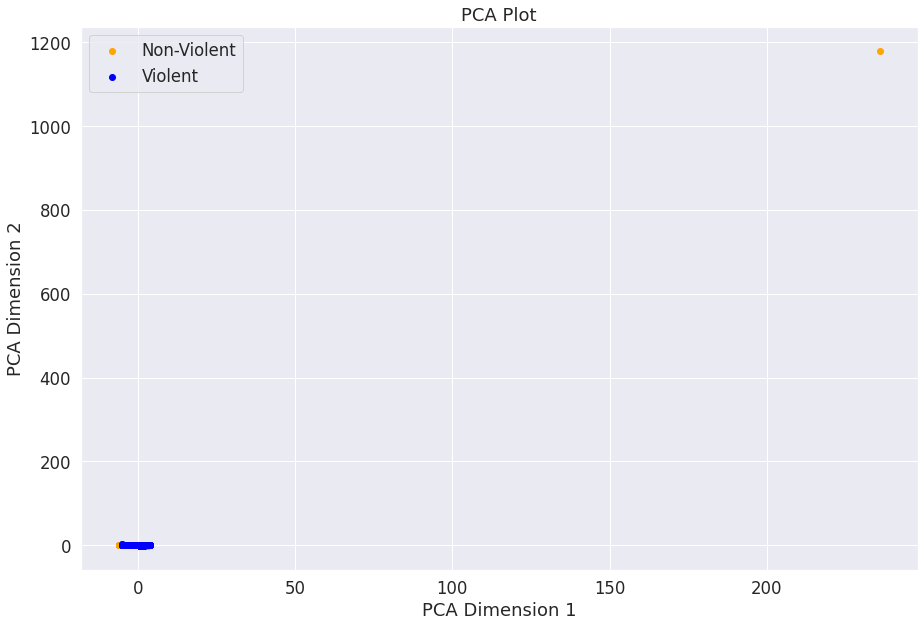

In [33]:
colors = ['orange','blue']
label_text = ["Non-Violent", "Violent"]

fig, ax = plt.subplots(figsize=(15,10))

for violence_level in [0,1]:
    cur_df = pca_Z_train[y_train==violence_level]
    ax =plt.scatter(cur_df[:,0], cur_df[:,1], c = colors[violence_level], label=label_text[violence_level])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();

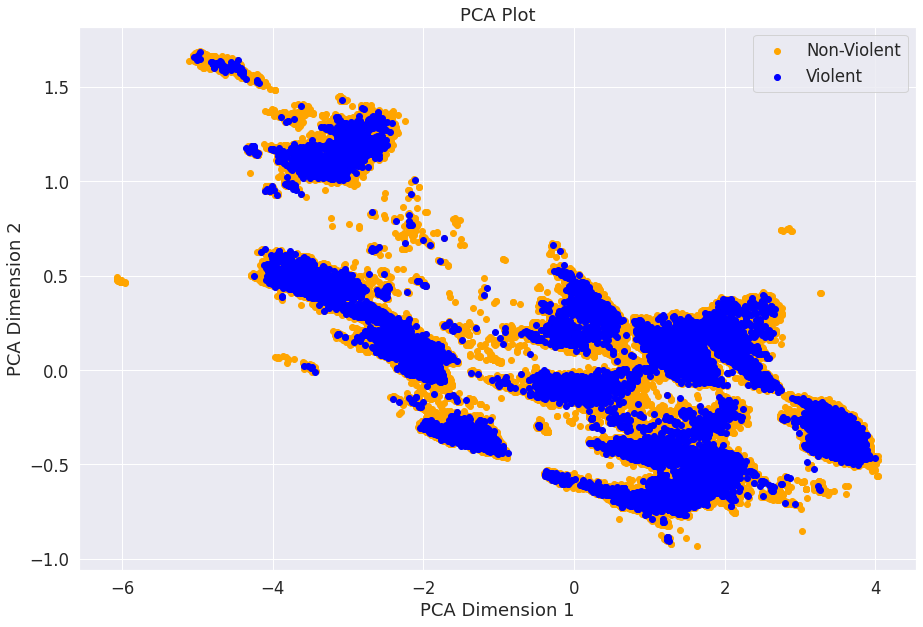

In [34]:
# attempt to remove apparent outlier in data
outlier_filter = (pca_Z_train[:,0] < 50) & (pca_Z_train[:,1]  < 50)
pca_Z_train_filter = pca_Z_train[outlier_filter]
y_train_filter = y_train[outlier_filter]

colors = ['orange','blue']
label_text = ["Non-Violent", "Violent"]

fig, ax = plt.subplots(figsize=(15,10))

for violence_level in [0,1]:
    cur_df = pca_Z_train_filter[y_train_filter==violence_level]
    ax =plt.scatter(cur_df[:,0], cur_df[:,1], c = colors[violence_level], label=label_text[violence_level])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();



/usr/local/lib/python3.6/dist-packages/google/colab/_event_manager.py:28: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


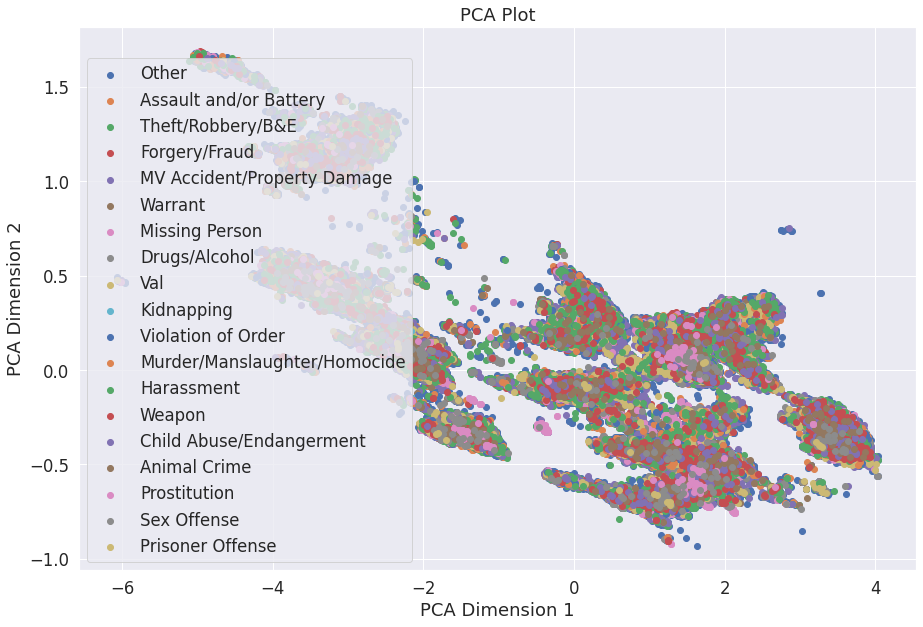

In [35]:
y_train_types = boston_crime_train['OFFENSE_TYPE'].values
y_train_types_filter = y_train_types[outlier_filter]
label_text = boston_crime_train['OFFENSE_TYPE'].unique()
colors = ['orange','blue']
fig, ax = plt.subplots(figsize=(15,10))

for i, offense_type in enumerate(label_text):
    cur_df = pca_Z_train_filter[y_train_types_filter==offense_type]
    ax =plt.scatter(x=cur_df[:,0], y=cur_df[:,1], label=label_text[i])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();

Variance explained by each PCA1 and PCA2: [0.06863323 0.048035  ]
Cumulative Variance Explained by PCA1 and PCA2: [0.06863323 0.11666823]
Total Number of PCA Components Needed for 90% variability 52


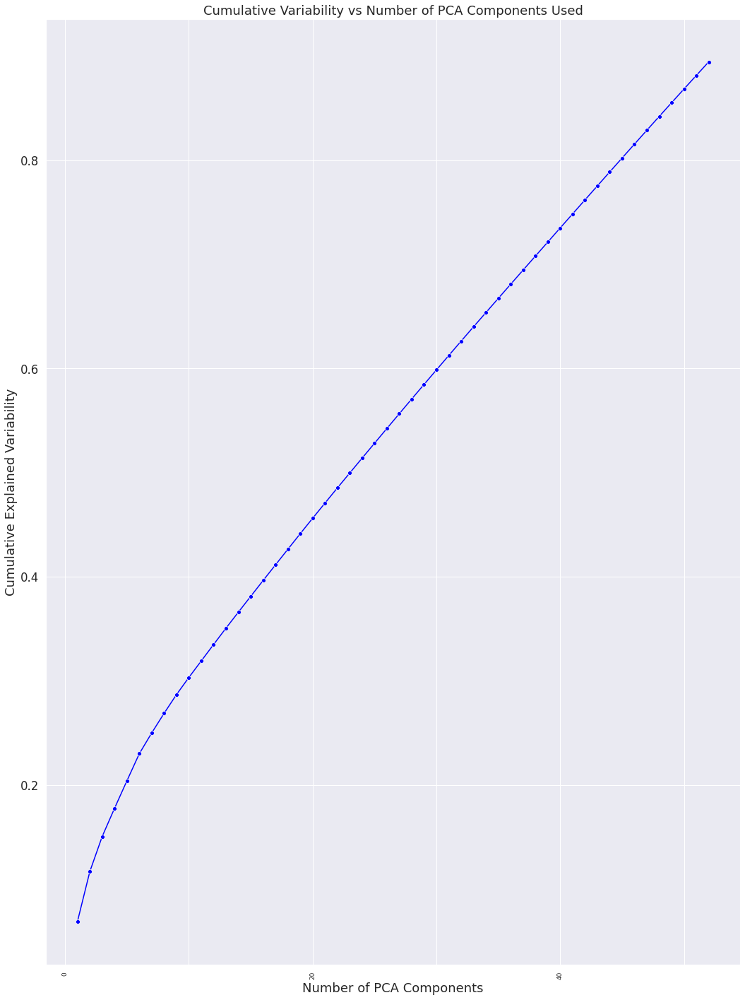

In [36]:
var_explained = pca_standard.explained_variance_ratio_
print("Variance explained by each PCA1 and PCA2:", var_explained[0:2])
print("Cumulative Variance Explained by PCA1 and PCA2:", np.cumsum(var_explained[0:2]))

total_cumulative = np.cumsum(var_explained)
accepted_variability = total_cumulative <= .9
pcas = list(range(1, total_cumulative[accepted_variability].size + 1))

print("Total Number of PCA Components Needed for 90% variability", len(pcas))
fig, ax = plt.subplots(figsize=(15,20))
ax = sns.lineplot(x=pcas,y=total_cumulative[accepted_variability], color="blue", marker="o")

plt.xticks(rotation=90, fontsize = 9)

for label in ax.xaxis.get_ticklabels()[::2]:
    label.set_visible(False)
    
plt.xlabel("Number of PCA Components")
plt.ylabel("Cumulative Explained Variability")
plt.title("Cumulative Variability vs Number of PCA Components Used")
plt.tight_layout()

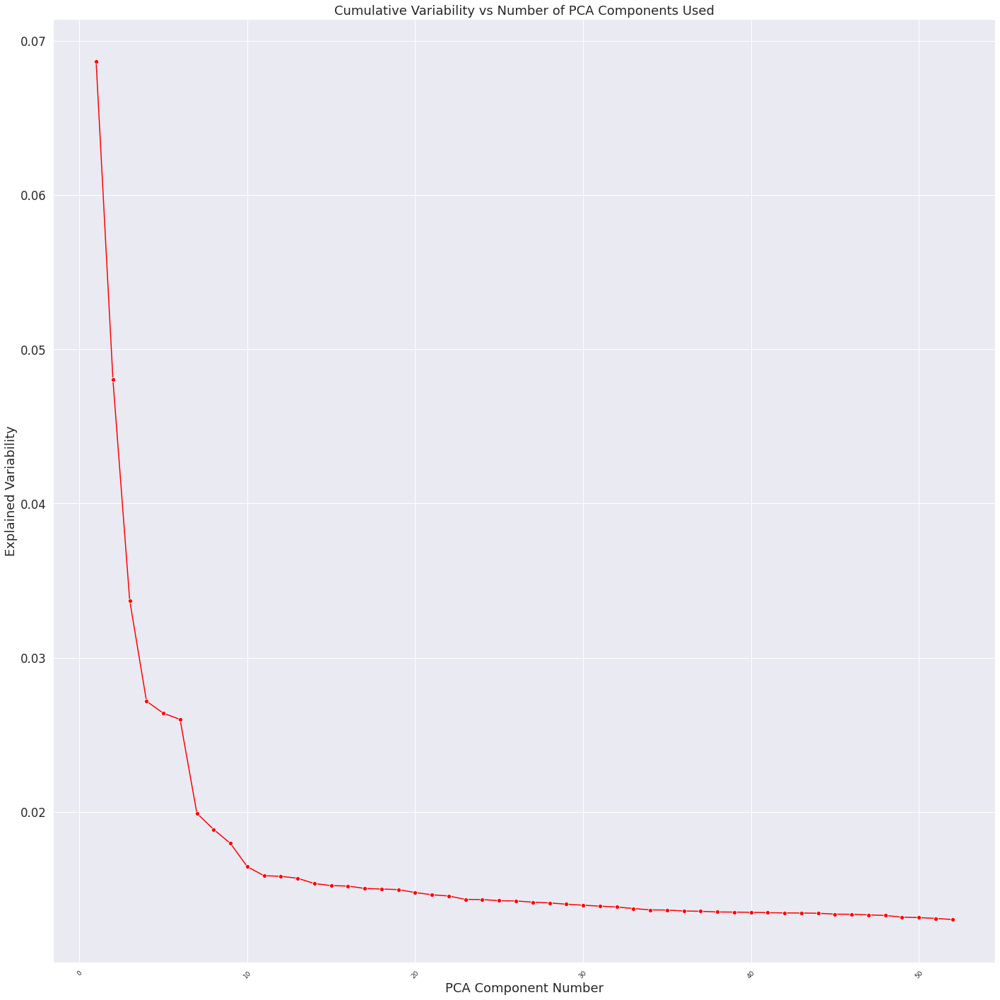

In [37]:
fig, ax = plt.subplots(figsize=(20,20))
ax = sns.lineplot(x=pcas,y=var_explained[accepted_variability], color="red", marker="o")

plt.xticks(rotation=45, fontsize = 9)
    
plt.ylabel("Explained Variability")
plt.xlabel("PCA Component Number")
plt.title("Cumulative Variability vs Number of PCA Components Used")
plt.tight_layout()

In [38]:
#Capture names and scores
names = []
scores = []

# Logistic Regression with 2 PCS vectors
logit_pcr2z = LogisticRegression(C=1000000,solver="lbfgs", max_iter = 10000).fit(pca_Z_train_filter[:,0:2],y_train_filter)
logit_pcr2z_score_train = round(logit_pcr2z.score(pca_Z_train_filter[:,0:2], y_train_filter),4)
logit_pcr2z_score_test = round(logit_pcr2z.score(pca_Z_test[:,0:2], y_test),4)

print(f'Training Accuracy: {logit_pcr2z_score_train}')
print(f'Testing Accuracy: {logit_pcr2z_score_test}')

names.append('Logistic Regression w/ 2 PCA')
scores.append([logit_pcr2z_score_train,logit_pcr2z_score_test])

Training Accuracy: 0.9183
Testing Accuracy: 0.9183


In [39]:
# Logistic Regression with 25 PCA vectors
logit_pcr100z = LogisticRegression(C=1000000,solver="lbfgs", max_iter = 10000).fit(pca_Z_train_filter[:,0:52],y_train_filter)
logit_pcr100z_score_train = round(logit_pcr100z.score(pca_Z_train_filter[:,0:52], y_train_filter),4)
logit_pcr100z_score_test = round(logit_pcr100z.score(pca_Z_test[:,0:52], y_test),4)

print(f'Training Accuracy: {logit_pcr100z_score_train}')
print(f'Testing Accuracy: {logit_pcr100z_score_test}')

names.append('Logistic Regression w/ 100 PCA')
scores.append([logit_pcr100z_score_train,logit_pcr100z_score_test])

Training Accuracy: 0.9183
Testing Accuracy: 0.9183


In [40]:
# Let's give adaboost a shot
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

def adaboost(depth, num_estimators, learning_rate, X_train, y_train, X_test, y_test):
    boost = AdaBoostClassifier( base_estimator = DecisionTreeClassifier(max_depth = depth), n_estimators=num_estimators, learning_rate=learning_rate)
    boost.fit(X_train, y_train)
    train_staged_score = list(boost.staged_score(X_train, y_train))
    test_staged_score = list(boost.staged_score(X_test, y_test))
    return train_staged_score, test_staged_score


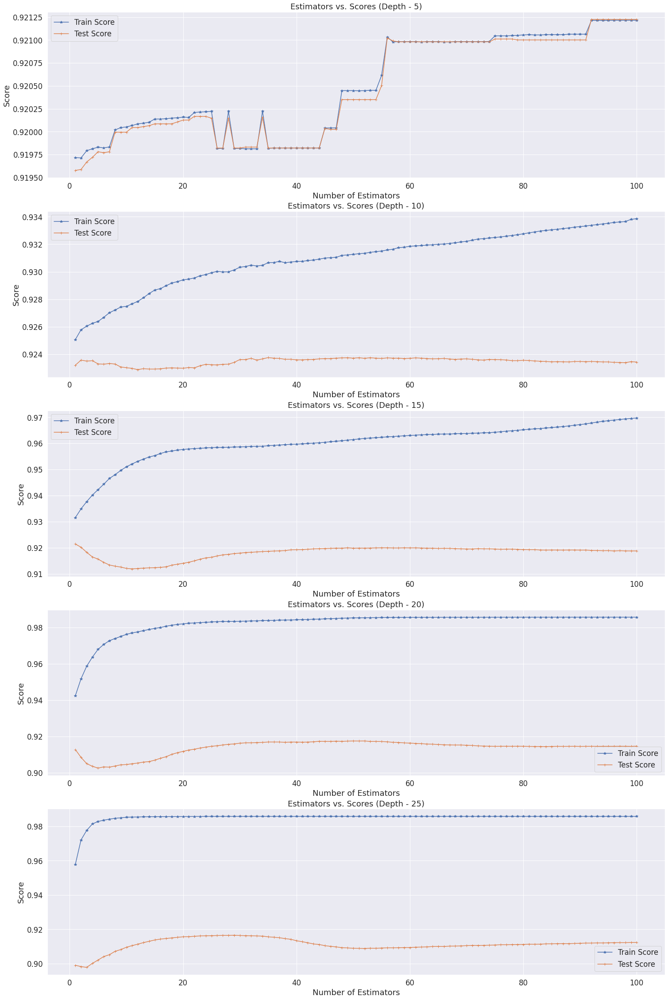

In [41]:
depths = [5,10,15,20,25]
n_estimators = 100
learning_rate = .05
num_estimators = range(1, 101)
fig, axs = plt.subplots(nrows=len(depths),ncols=1,figsize=(25,40))
score_gap = []
best_score = []
best_iteration = []

for i, depth in enumerate(depths):
    train, test = adaboost(depth,n_estimators,learning_rate, X_train, y_train, X_test, y_test)
    max_idx = np.argmax(test)
    best_score.append(test[max_idx])
    best_iteration.append(max_idx)
    score_gap.append(np.abs(train[max_idx] - test[max_idx]))
    axs[i].plot(num_estimators, train, '*-', label="Train Score")
    axs[i].plot(num_estimators, test, '-+', label="Test Score")
    axs[i].legend()
    axs[i].set_title(f"Estimators vs. Scores (Depth - {depth})")
    axs[i].set_ylabel("Score")
    axs[i].set_xlabel("Number of Estimators")  

In [42]:
boost_depth_performance = {'depths': depths, 'best test score': best_score, 'train-test delta':score_gap, 'iteration': best_iteration}
pd.DataFrame.from_dict(boost_depth_performance).set_index('depths')

,best test score,train-test delta,iteration
depths,,,
5,0.921224,0.000011,91
10,0.923756,0.006900,34
15,0.921387,0.010159,0
20,0.917442,0.067943,51
25,0.916598,0.069114,28


In [43]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression

# we'll now evaluate for violent crime in using both cities using all features (minus the other response variable for Offense Type)
demog_category_columns = ['YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR']
train_crime_demog_dummies_df = pd.get_dummies(comb_crime_train.drop(columns=["OFFENSE_TYPE"]), columns=demog_category_columns)
test_crime_demog_dummies_df = pd.get_dummies(comb_crime_test.drop(columns=["OFFENSE_TYPE"]), columns=demog_category_columns)

# select all columns from dummies minus response, Geohash, Latitude, Longitude 
x_columns = train_crime_demog_dummies_df.drop(columns=["VIOLENT_CRIME","GEOHASH","LATITUDE","LONGITUDE","AREA"]).columns

X_train = train_crime_demog_dummies_df[x_columns]
X_test = test_crime_demog_dummies_df[x_columns]

demog_scaler = MinMaxScaler()
demog_scaler.fit(X_train)
x_train_norm = demog_scaler.transform(X_train)
x_test_norm = demog_scaler.transform(X_test)

y_train = train_crime_demog_dummies_df['VIOLENT_CRIME'].values
y_test = test_crime_demog_dummies_df['VIOLENT_CRIME'].values

# attempt a baseline logistic regression without regularization
demog_logit_full = LogisticRegression(penalty='none', max_iter = 10000)
demog_logit_full.fit(x_train_norm,y_train)
demog_logit_full_train_accuracy = round(demog_logit_full.score(x_train_norm, y_train),3)
demog_logit_full_test_accuracy = round(demog_logit_full.score(x_test_norm, y_test),3)

b0 = round(demog_logit_full.intercept_[0],3)
print(f"Logistic Regression Estimated Betas (B0): {b0}")

for i, k in enumerate(x_columns):
    print(f"Logistic Regression Estimated Beta {k} (B{i + 1}): { round(demog_logit_full.coef_[0][i],3)}")

print(f"\nLogisitic Train Accuracy: {demog_logit_full_train_accuracy}, Logistic Test Accuracy: {demog_logit_full_test_accuracy}")

Logistic Regression Estimated Betas (B0): -17.948
Logistic Regression Estimated Beta COVID_PERIOD (B1): -0.041
Logistic Regression Estimated Beta WHITE (B2): 20.983
Logistic Regression Estimated Beta BLACK (B3): 21.417
Logistic Regression Estimated Beta ASIAN (B4): 8.37
Logistic Regression Estimated Beta HISPANIC (B5): 15.681
Logistic Regression Estimated Beta MEDIAN_INCOME (B6): 0.198
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B7): -14.212
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B8): -0.929
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B9): -6.407
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B10): -5.916
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B11): 0.235
Logistic Regression Estimated Beta ELECTION (B12): 0.067
Logistic Regression Estimated Beta PRCP (B13): -0.071
Logistic Regression Estimated Beta SNOW (B14): -0.791
Logistic Regression Estimated Beta NIGHT (B15): -0.64
Logistic Regression Estimated Beta YEAR_2015 (B1

In [44]:
from sklearn.linear_model import LogisticRegressionCV
c_list = [1e-3,1e-2,1e-1,1e0,1e1,1e2,1e3]
folds = 3
training_score = []

logit_lasso= LogisticRegressionCV(Cs=c_list, penalty='l2',solver='liblinear', max_iter = 1000, scoring='accuracy',cv=folds)
logit_lasso.fit(x_train_norm, y_train)
logit_lasso_score_train = logit_lasso.score(x_train_norm, y_train)
logit_lasso_score_test = logit_lasso.score(x_test_norm, y_test)

In [45]:
print(
    "The regularization parameter C chosen by this model: {}\n"
    "Training Accuracy: {:.3f}\n"
    "Test Accuracy: {:.3f}\n"
    .format(logit_lasso.C_[0], logit_lasso_score_train, logit_lasso_score_test)
)

The regularization parameter C chosen by this model: 0.001
Training Accuracy: 0.882
Test Accuracy: 0.882



In [46]:
# Balancing weight of the LR
demog_logit_balanced = LogisticRegression(penalty='none', max_iter = 10000, class_weight="balanced")
demog_logit_balanced.fit(x_train_norm,y_train)
demog_logit_balanced_train_accuracy = round(demog_logit_balanced.score(x_train_norm, y_train),3)
demog_logit_balanced_test_accuracy = round(demog_logit_balanced.score(x_test_norm, y_test),3)

b0 = round(demog_logit_balanced.intercept_[0],3)
print(f"Logistic Regression Estimated Betas (B0): {b0}")

for i, k in enumerate(x_columns):
    print(f"Logistic Regression Estimated Beta {k} (B{i + 1}): { round(demog_logit_balanced.coef_[0][i],3)}")

print(f"\nLogisitic Train Accuracy: {demog_logit_balanced_train_accuracy}, Logistic Test Accuracy: {demog_logit_balanced_test_accuracy}")

Logistic Regression Estimated Betas (B0): -13.609
Logistic Regression Estimated Beta COVID_PERIOD (B1): -0.024
Logistic Regression Estimated Beta WHITE (B2): 17.151
Logistic Regression Estimated Beta BLACK (B3): 17.717
Logistic Regression Estimated Beta ASIAN (B4): 7.14
Logistic Regression Estimated Beta HISPANIC (B5): 13.092
Logistic Regression Estimated Beta MEDIAN_INCOME (B6): 0.213
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B7): -9.381
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B8): -1.285
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B9): -1011.925
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B10): -957.858
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B11): 1.174
Logistic Regression Estimated Beta ELECTION (B12): 0.381
Logistic Regression Estimated Beta PRCP (B13): -0.067
Logistic Regression Estimated Beta SNOW (B14): -0.737
Logistic Regression Estimated Beta NIGHT (B15): -0.366
Logistic Regression Estimated Beta YEAR_201

In [47]:
ss = StandardScaler().fit(X_train)
Z_train = ss.transform(X_train)
Z_test = ss.transform(X_test)

pca_standard = PCA().fit(Z_train)
pca_Z_train = pca_standard.transform(Z_train)
pca_Z_test = pca_standard.transform(Z_test)

print(f"PCA Training Z Shape{pca_Z_train.shape}")
print(f"PCA Test Z Shape{pca_Z_test.shape}")

PCA Training Z Shape(638447, 64)
PCA Test Z Shape(159612, 64)


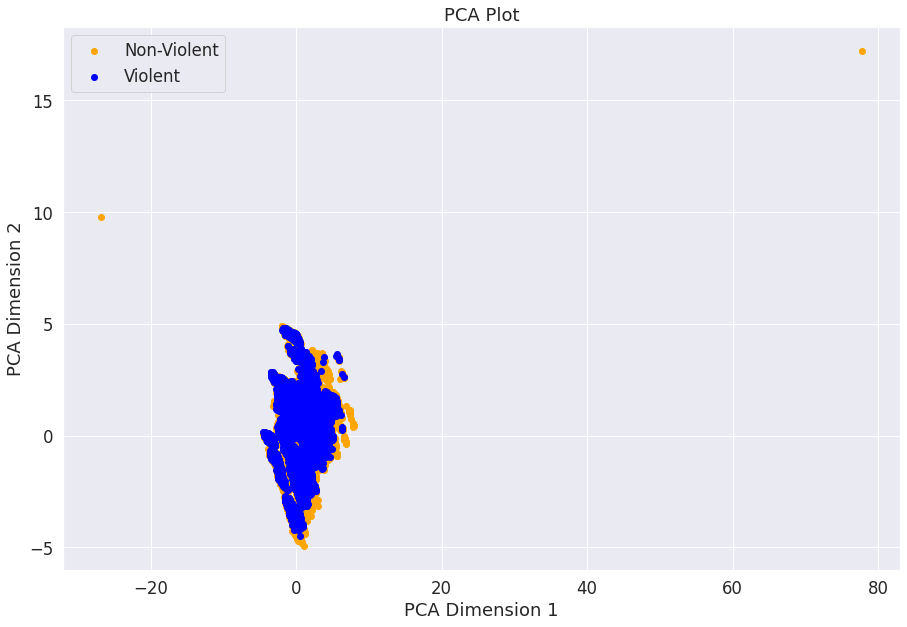

In [48]:
colors = ['orange','blue']
label_text = ["Non-Violent", "Violent"]

fig, ax = plt.subplots(figsize=(15,10))

for violence_level in [0,1]:
    cur_df = pca_Z_train[y_train==violence_level]
    ax =plt.scatter(cur_df[:,0], cur_df[:,1], c = colors[violence_level], label=label_text[violence_level])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();

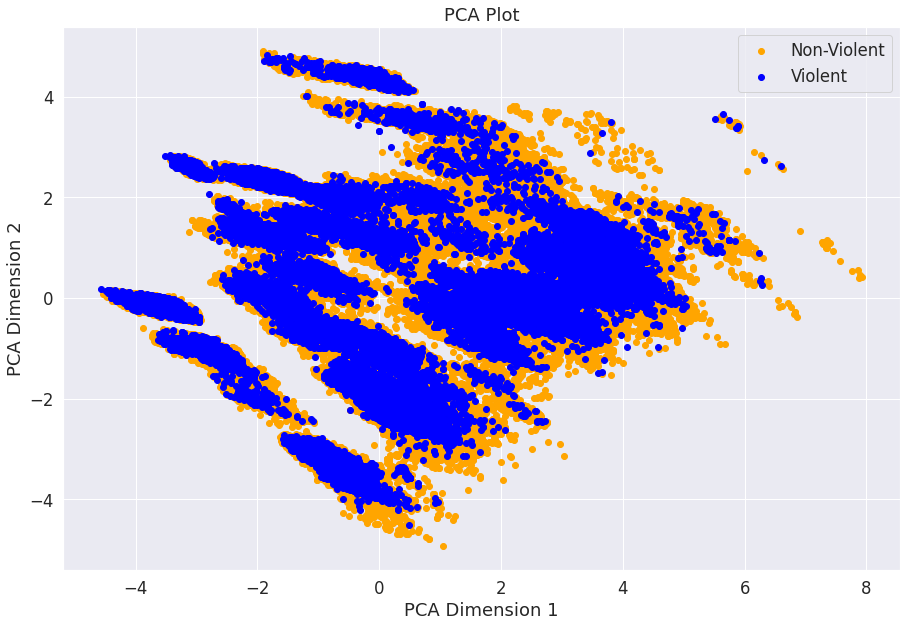

In [49]:
outlier_filter = (pca_Z_train[:,0] > -20) & (pca_Z_train[:,0]  < 60)
pca_Z_train_filter = pca_Z_train[outlier_filter]
y_train_filter = y_train[outlier_filter]

colors = ['orange','blue']
label_text = ["Non-Violent", "Violent"]

fig, ax = plt.subplots(figsize=(15,10))

for violence_level in [0,1]:
    cur_df = pca_Z_train_filter[y_train_filter==violence_level]
    ax =plt.scatter(cur_df[:,0], cur_df[:,1], c = colors[violence_level], label=label_text[violence_level])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();


/usr/local/lib/python3.6/dist-packages/google/colab/_event_manager.py:28: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.6/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


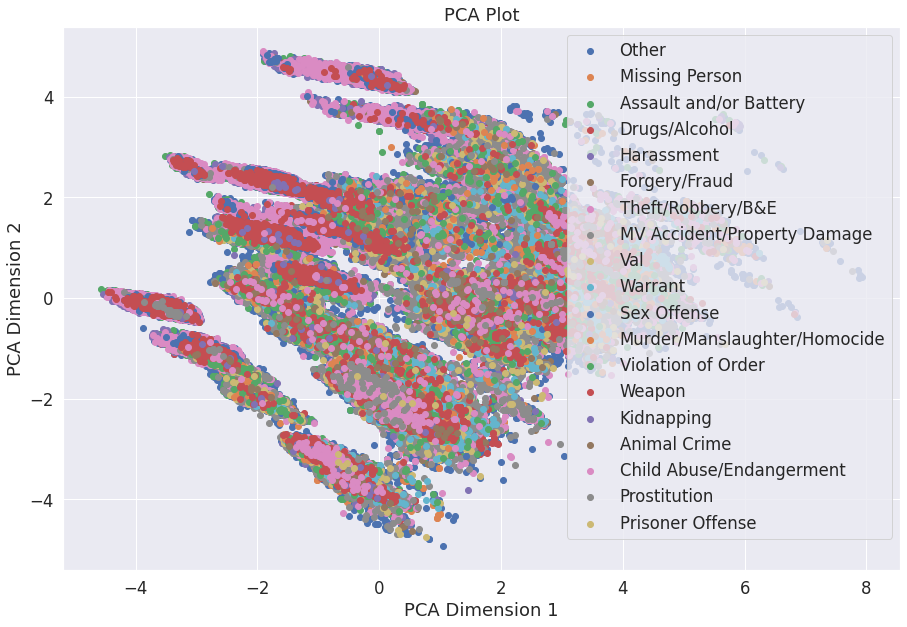

In [50]:
y_train_types = comb_crime_train['OFFENSE_TYPE'].values
y_train_types_filter = y_train_types[outlier_filter]
label_text = comb_crime_train['OFFENSE_TYPE'].unique()
colors = ['orange','blue']
fig, ax = plt.subplots(figsize=(15,10))

for i, offense_type in enumerate(label_text):
    cur_df = pca_Z_train_filter[y_train_types_filter==offense_type]
    ax =plt.scatter(x=cur_df[:,0], y=cur_df[:,1], label=label_text[i])

plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.title("PCA Plot")
plt.legend();

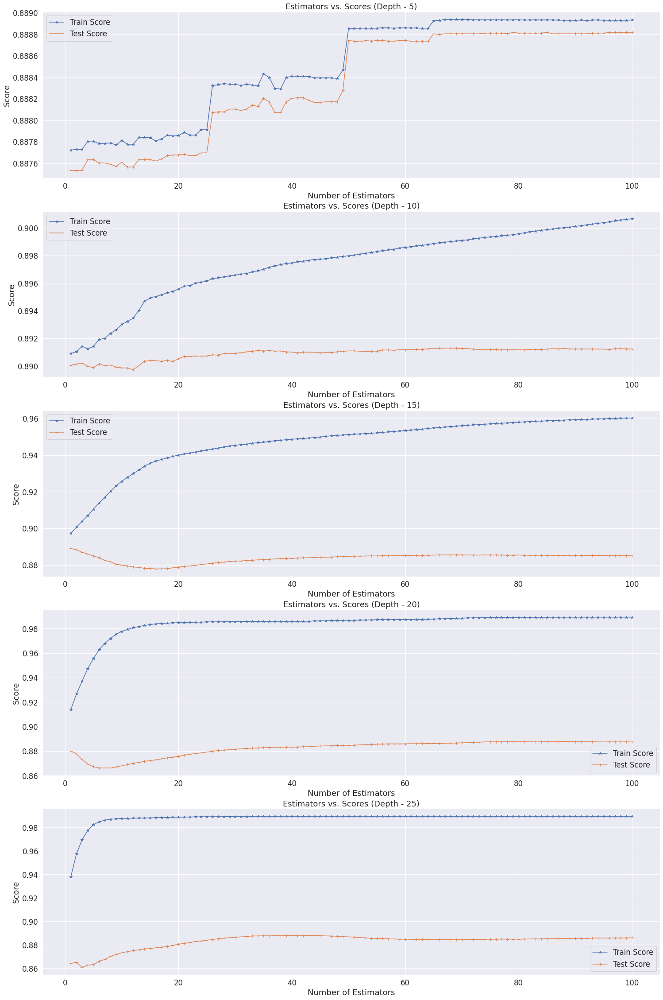

In [51]:
depths = [5,10,15,20,25]
n_estimators = 100
learning_rate = .05
num_estimators = range(1, 101)
fig, axs = plt.subplots(nrows=len(depths),ncols=1,figsize=(25,40))
score_gap = []
best_score = []
best_iteration = []

for i, depth in enumerate(depths):
    train, test = adaboost(depth,n_estimators,learning_rate,X_train, y_train, X_test, y_test)
    max_idx = np.argmax(test)
    best_score.append(test[max_idx])
    best_iteration.append(max_idx)
    score_gap.append(np.abs(train[max_idx] - test[max_idx]))
    axs[i].plot(num_estimators, train, '*-', label="Train Score")
    axs[i].plot(num_estimators, test, '-+', label="Test Score")
    axs[i].legend()
    axs[i].set_title(f"Estimators vs. Scores (Depth - {depth})")
    axs[i].set_ylabel("Score")
    axs[i].set_xlabel("Number of Estimators")  

In [52]:
boost_depth_performance = {'depths': depths, 'best test score': best_score, 'train-test delta':score_gap, 'iteration': best_iteration}
pd.DataFrame.from_dict(boost_depth_performance).set_index('depths')

,best test score,train-test delta,iteration
depths,,,
5,0.888818,0.000117,78
10,0.891305,0.007714,67
15,0.889018,0.008311,0
20,0.887822,0.101429,87
25,0.887909,0.101451,43


In [54]:
# Offense Type Logistic Regression
# we'll evaluate for violent crime in Boston using all features (minus the other response variable for Offense Type)
demog_category_columns = ['AREA', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR']
train_crime_demog_dummies_df = pd.get_dummies(boston_crime_train.drop(columns=["OFFENSE_TYPE","VIOLENT_CRIME","GEOHASH"]), columns=demog_category_columns)
test_crime_demog_dummies_df = pd.get_dummies(boston_crime_test.drop(columns=["OFFENSE_TYPE","VIOLENT_CRIME","GEOHASH"]), columns=demog_category_columns)

# select all columns from dummies minus response and Geohash 
x_columns = train_crime_demog_dummies_df.columns

X_train = train_crime_demog_dummies_df[x_columns]
X_test = test_crime_demog_dummies_df[x_columns]

demog_scaler = MinMaxScaler()
demog_scaler.fit(X_train)
x_train_norm = demog_scaler.transform(X_train)
x_test_norm = demog_scaler.transform(X_test)

y_train = boston_crime_train['OFFENSE_TYPE'].values
y_test = boston_crime_test['OFFENSE_TYPE'].values

# attempt a baseline logistic regression without regularization
demog_logit_full = LogisticRegression(penalty='none', max_iter = 10000)
demog_logit_full.fit(x_train_norm,y_train)
demog_logit_full_train_accuracy = round(demog_logit_full.score(x_train_norm, y_train),3)
demog_logit_full_test_accuracy = round(demog_logit_full.score(x_test_norm, y_test),3)

b0 = round(demog_logit_full.intercept_[0],3)
print(f"Logistic Regression Estimated Betas (B0): {b0}")

for i, k in enumerate(x_columns):
    print(f"Logistic Regression Estimated Beta {k} (B{i + 1}): { round(demog_logit_full.coef_[0][i],3)}")

print(f"\nLogisitic Train Accuracy: {demog_logit_full_train_accuracy}, Logistic Test Accuracy: {demog_logit_full_test_accuracy}")

Logistic Regression Estimated Betas (B0): -0.23
Logistic Regression Estimated Beta LATITUDE (B1): -0.408
Logistic Regression Estimated Beta LONGITUDE (B2): -0.082
Logistic Regression Estimated Beta COVID_PERIOD (B3): -0.019
Logistic Regression Estimated Beta WHITE (B4): 0.05
Logistic Regression Estimated Beta BLACK (B5): -0.325
Logistic Regression Estimated Beta ASIAN (B6): -0.394
Logistic Regression Estimated Beta HISPANIC (B7): 0.164
Logistic Regression Estimated Beta MEDIAN_INCOME (B8): 0.024
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B9): -2.463
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B10): -2.112
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B11): 0.011
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B12): -0.016
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B13): -0.179
Logistic Regression Estimated Beta ELECTION (B14): 0.061
Logistic Regression Estimated Beta PRCP (B15): 0.25
Logistic Regression Estimated Beta SNOW (B16)

In [55]:
for i, classification in enumerate(demog_logit_full.classes_):
  print(f"\nFor offense type {classification}:\n")
  b0 = round(demog_logit_full.intercept_[i],3)
  print(f"Logistic Regression Estimated Betas (B0): {b0}")

  for j, k in enumerate(x_columns):
      print(f"Logistic Regression Estimated Beta {k} (B{j + 1}): { round(demog_logit_full.coef_[i][j],3)}")



For offense type Animal Crime:

Logistic Regression Estimated Betas (B0): -0.23
Logistic Regression Estimated Beta LATITUDE (B1): -0.408
Logistic Regression Estimated Beta LONGITUDE (B2): -0.082
Logistic Regression Estimated Beta COVID_PERIOD (B3): -0.019
Logistic Regression Estimated Beta WHITE (B4): 0.05
Logistic Regression Estimated Beta BLACK (B5): -0.325
Logistic Regression Estimated Beta ASIAN (B6): -0.394
Logistic Regression Estimated Beta HISPANIC (B7): 0.164
Logistic Regression Estimated Beta MEDIAN_INCOME (B8): 0.024
Logistic Regression Estimated Beta LOCAL_PROP_VALUES (B9): -2.463
Logistic Regression Estimated Beta STREETLIGHT_DENSITY (B10): -2.112
Logistic Regression Estimated Beta POLICE_STATION_DISTANCE (B11): 0.011
Logistic Regression Estimated Beta HOSPITAL_DISTANCE (B12): -0.016
Logistic Regression Estimated Beta COLLEGE_UNIV_DISTANCE (B13): -0.179
Logistic Regression Estimated Beta ELECTION (B14): 0.061
Logistic Regression Estimated Beta PRCP (B15): 0.25
Logistic Reg

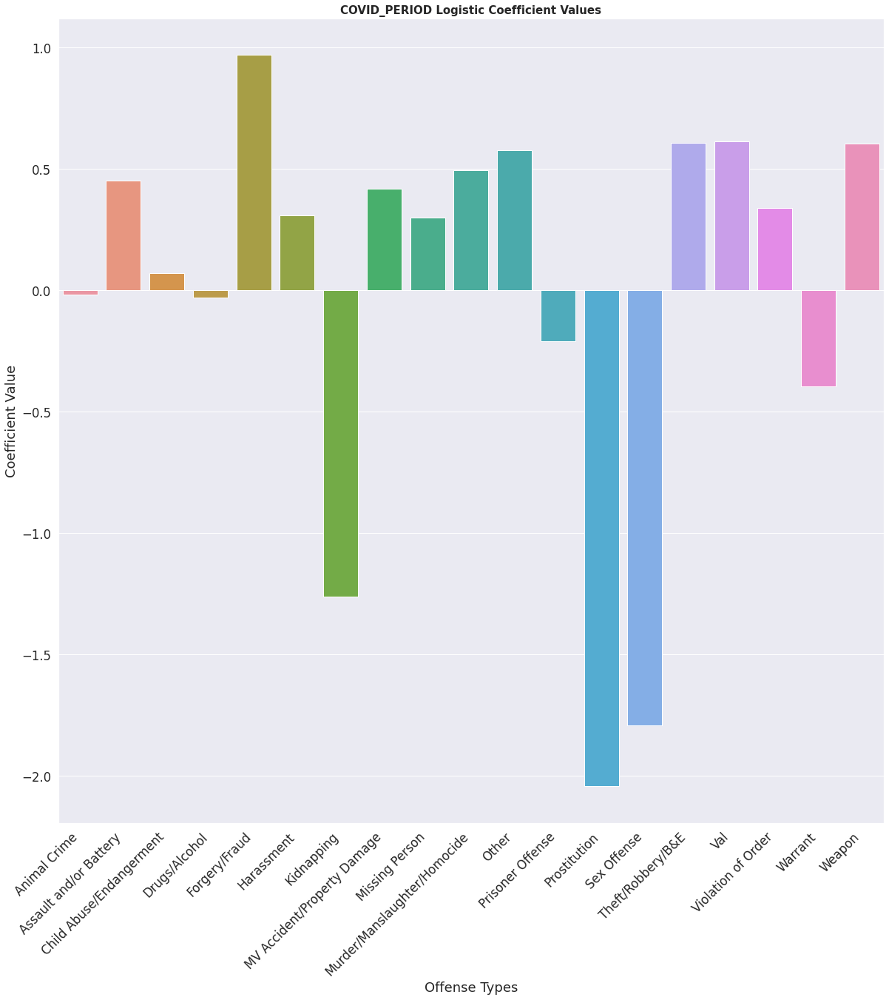

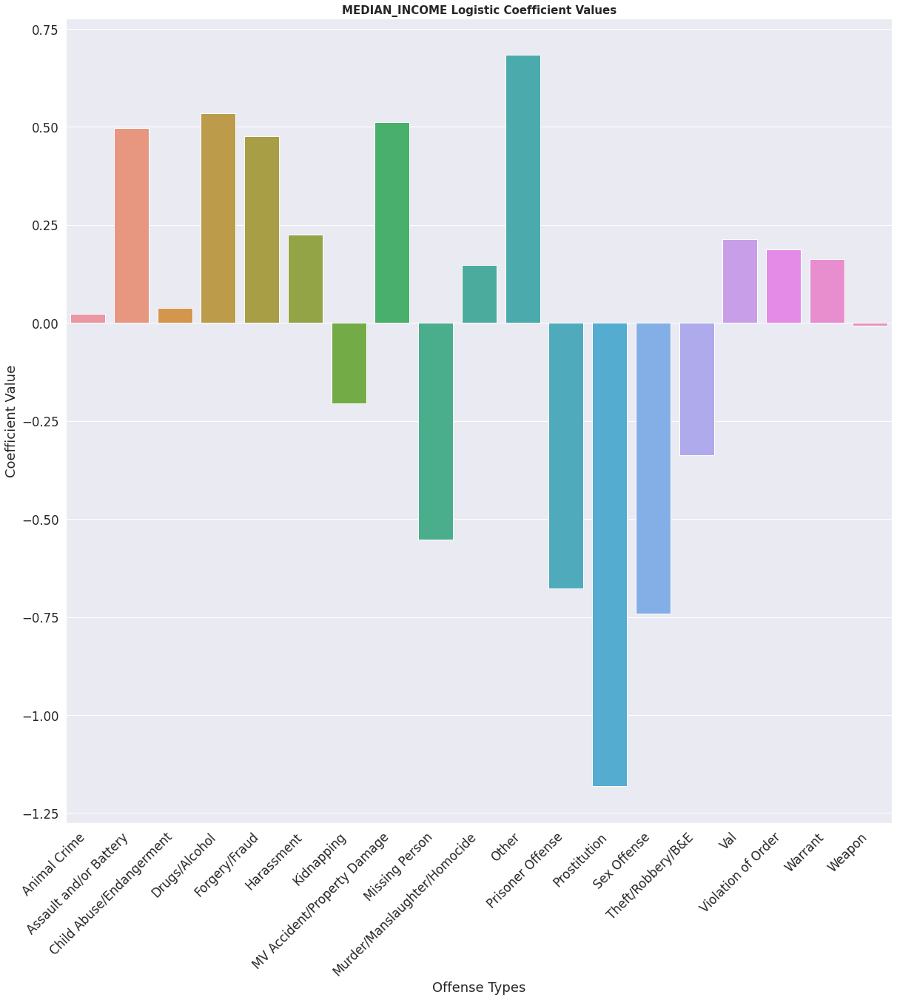

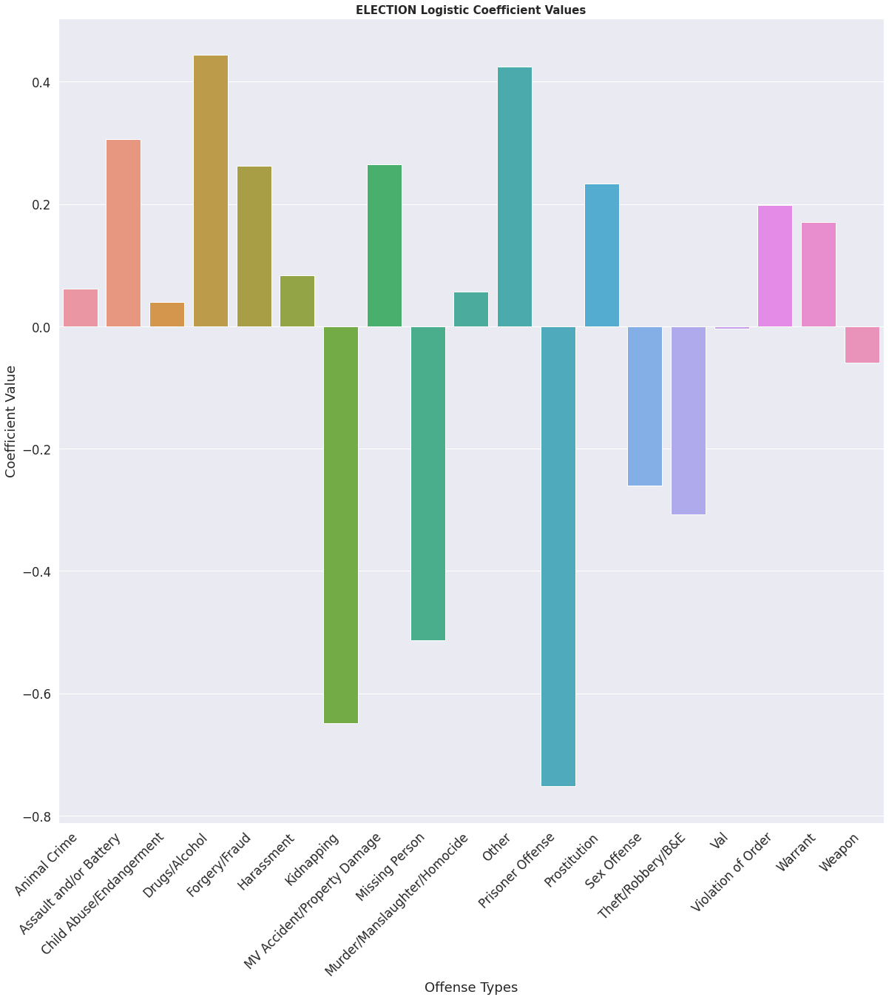

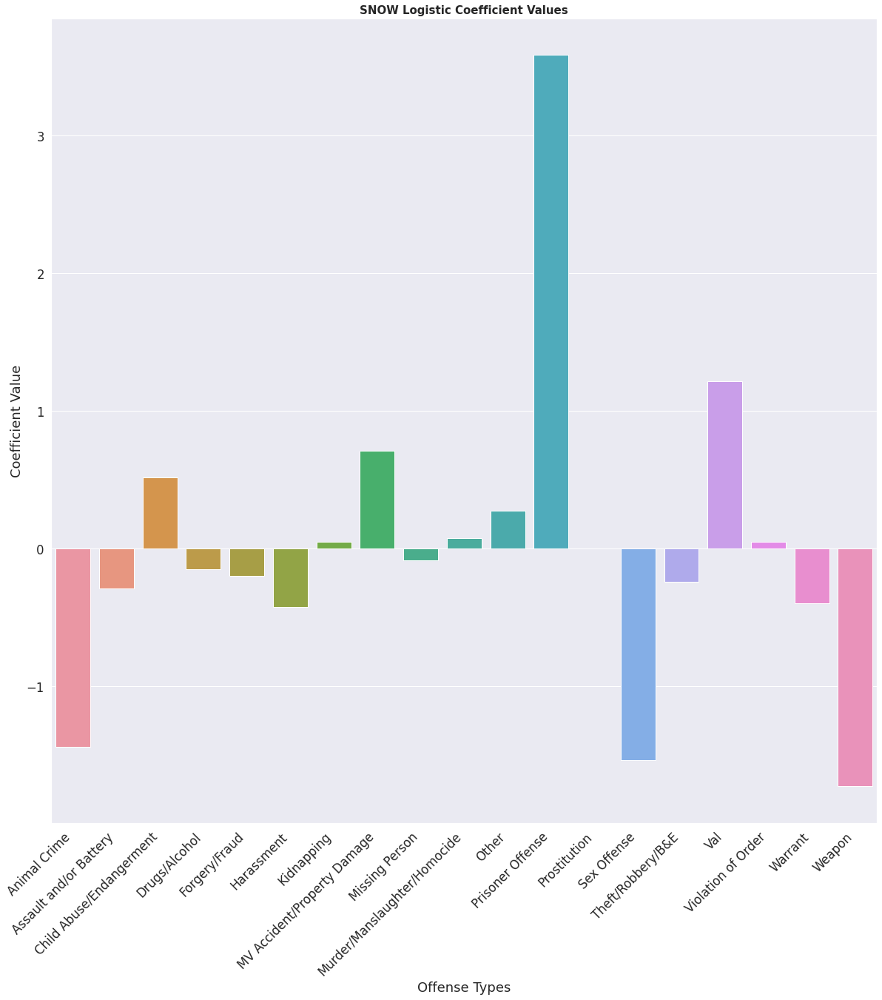

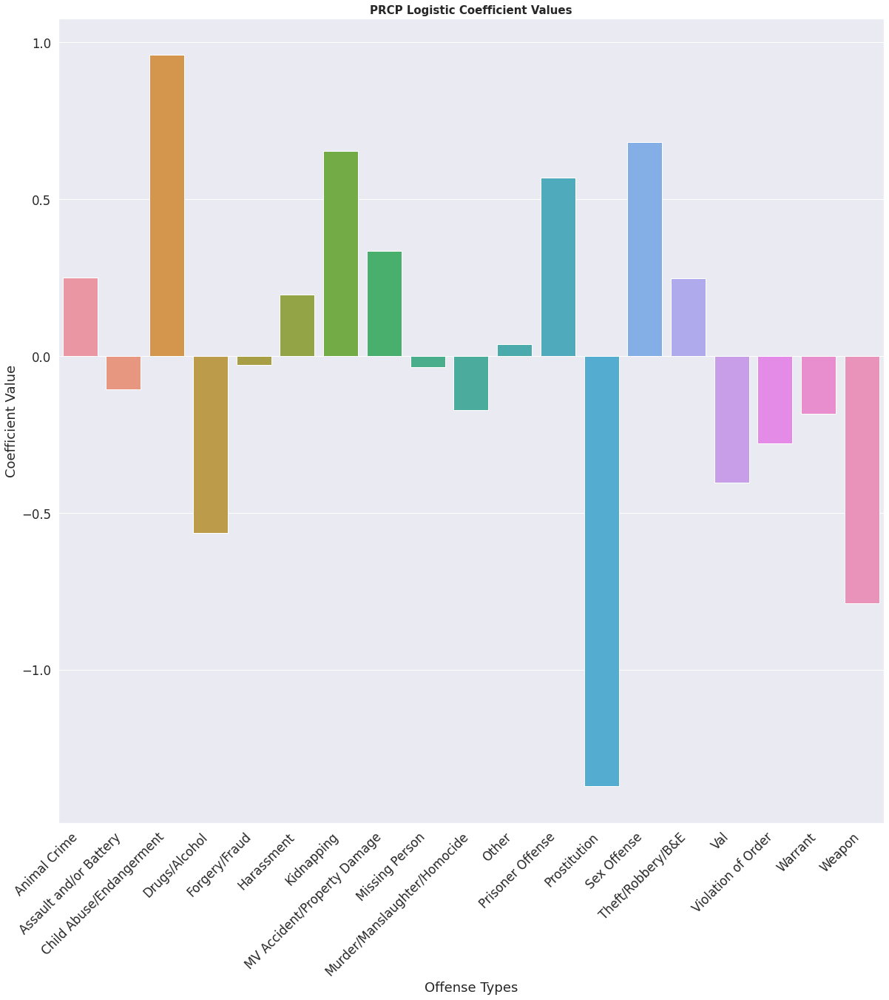

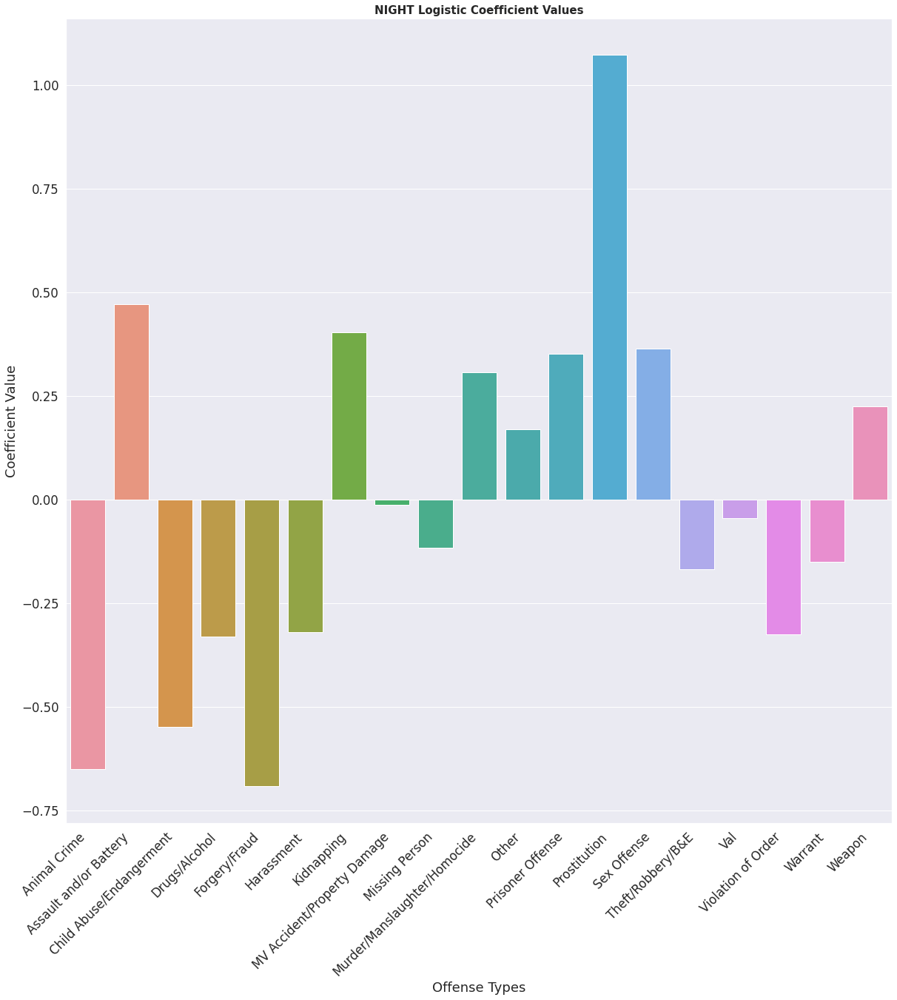

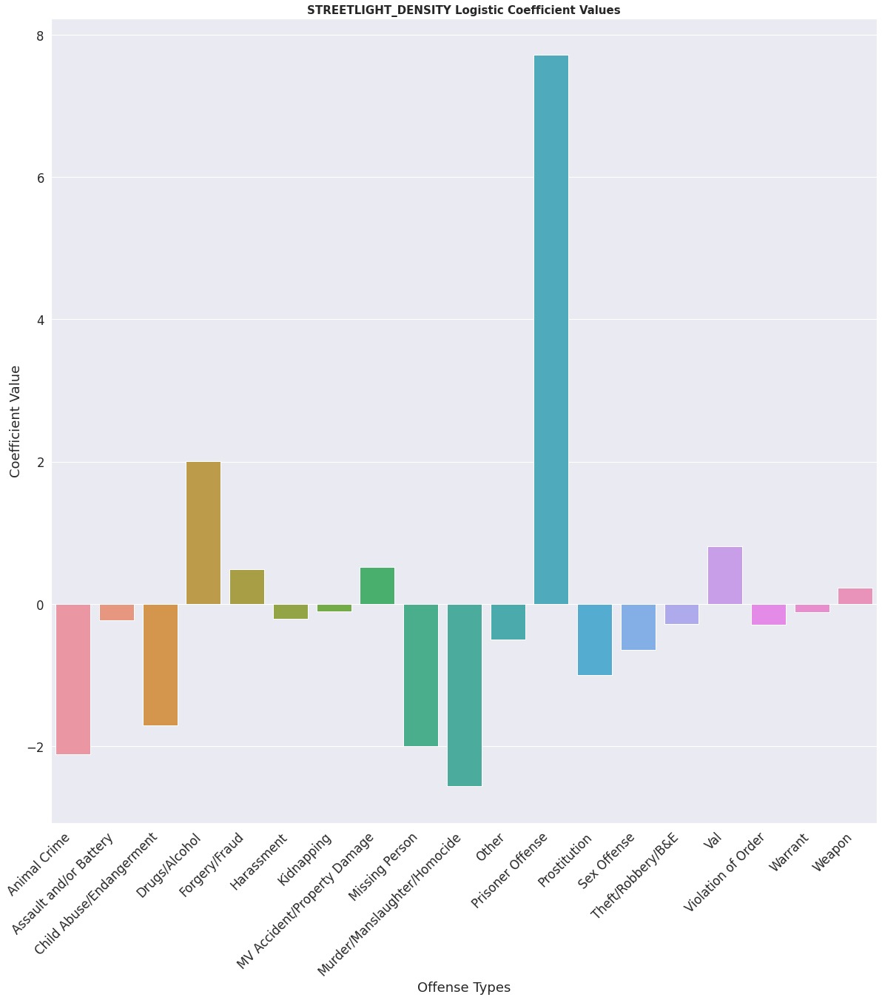

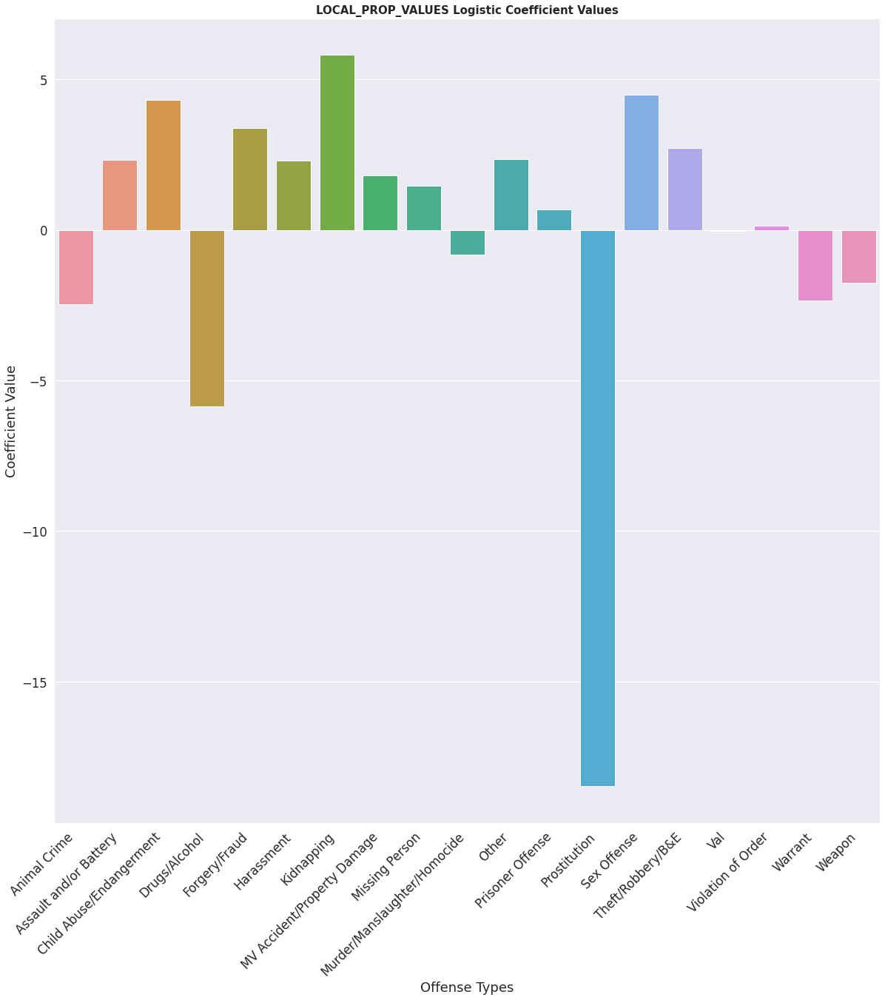

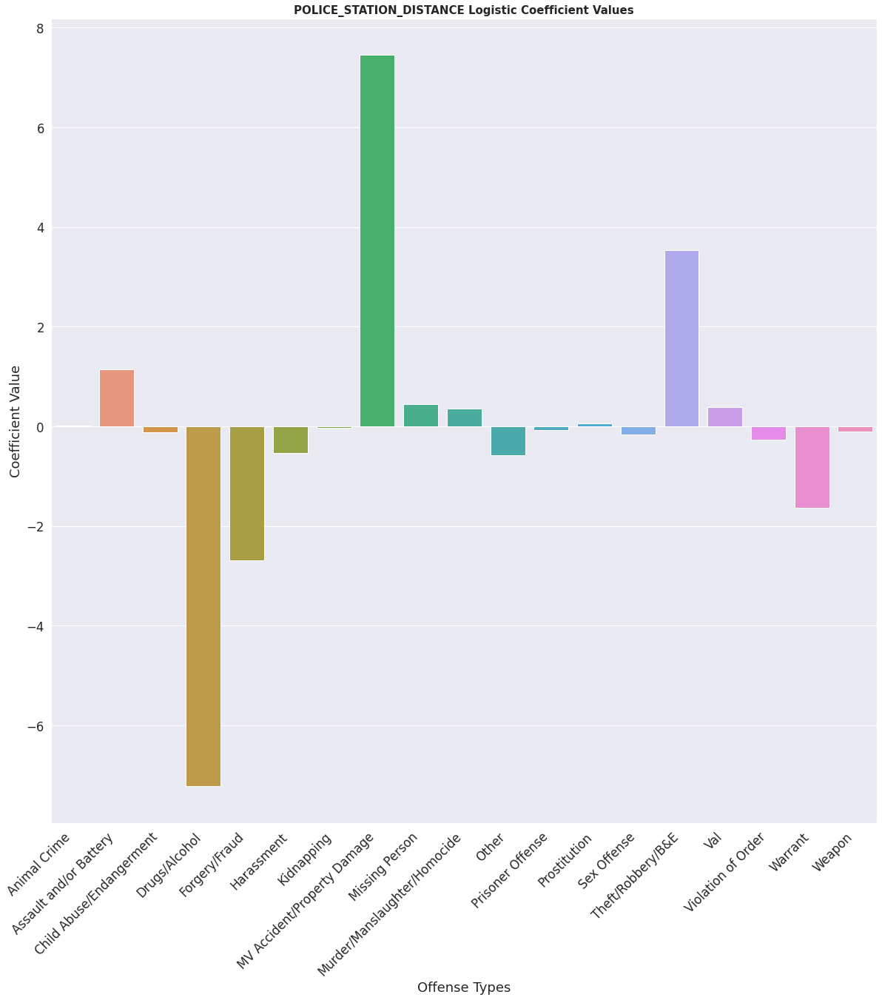

In [64]:
coeffs = {}

for i, k in enumerate(x_columns): 
    x = []
    y = []
    for j, classification in enumerate(demog_logit_full.classes_):
      x.append(classification)
      y.append(round(demog_logit_full.coef_[j][i],3))
    coeffs[k] = {"x": x, "y":y}  

for i, k in enumerate(["COVID_PERIOD","MEDIAN_INCOME","ELECTION","SNOW","PRCP","NIGHT","STREETLIGHT_DENSITY","LOCAL_PROP_VALUES","POLICE_STATION_DISTANCE"]):
  fig, ax = plt.subplots(figsize=(20,20))
  sns.barplot(x=coeffs[k]["x"], y=coeffs[k]["y"],ax=ax)
  ax.set_title(f"{k} Logistic Coefficient Values", fontdict={ 'weight' : 'bold','size': 15})
  ax.set_ylabel("Coefficient Value")
  ax.set_xlabel("Offense Types")
  ax.set_xticklabels(coeffs[k]["x"], rotation = 45, ha="right")
  plt.show()